# Transfer Learning Optimization: Normalization Techniques and Gradient Dynamics
By Amirhossein Abolhasani

## Environment Setup & Data Prepration

### Environment Setup

In [ ]:
import torch
from torch.utils.data import DataLoader, Dataset, TensorDataset

import torchvision
from torchvision.datasets import CIFAR10
from torchvision import transforms

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

import pandas as pd
import numpy as np
import math

import json
import os
import copy
from tqdm.notebook import tqdm

from typing import List, Tuple, Dict, Union, Optional

import warnings
warnings.filterwarnings('ignore')

### Config Dict

In [ ]:
config = {
    'batch_size': 64,
    'lr': 1e-3,
    'epochs': 15,
    'device': 'cuda' if torch.cuda.is_available() else 'cpu',
    'seed': 42
}

In [ ]:
torch.manual_seed(config['seed'])

### W&B Setup and Logging Functions

In [ ]:
wandb_config = {
    'project': 'Normalization Techniques and Gradient Dynamics',
    'entity': 'amiraaz'
}

In [ ]:
from google.colab import userdata
wandb_api_key = userdata.get('wandb') # Change with your wandb api key

In [ ]:
import wandb
wandb.login()

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter:

 ··········


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: amiraaz to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [ ]:
# logging functions ...

In [ ]:
def load_log() -> None:
  print('Logging Dataset to W&B ...')

  with wandb.init(
      entity='amiraaz',
      project='Normalization Techniques and Gradient Dynamics',
      job_type='load_raw_dataset'
  ) as run:

    names = ['Training Set', 'Validation Set', 'Test Set']
    datasets = load_dataset()
    train, val, test = datasets

    raw_data = wandb.Artifact(
        'CIFAR10_Dataset_Raw',
        type='dataset',
        description='CIFAR10 Dataset split into train/val/Test',
        metadata={
            'train_size': len(train),
            'validation_size': len(val),
            'test_size': len(test),
            'souruce': 'torchvision.datasets.CIFAR10'
        }
    )

    for name, data in zip(names, datasets):
      with raw_data.new_file(f'{name}.pt', mode='wb') as file:
        X, y = data.tensors
        torch.save((X, y), file)

    run.log_artifact(raw_data)
    print('___ Dataset logged to W&B ___')

### Dataset Loading

In [ ]:
def load_dataset():
  train_dataset = CIFAR10(root='./data', train=True, download=True, transform=transforms.ToTensor())
  # x_train, y_train = train_dataset.data, train_dataset.targets
  test_dataset = CIFAR10(root='./data', train=False, download=True, transform=transforms.ToTensor())


  split_point = math.floor(len(test_dataset) * 0.8)
  x_val, y_val = test_dataset.data[:split_point], test_dataset.targets[:split_point]
  x_test, y_test = test_dataset.data[split_point:], test_dataset.targets[split_point:]

  train_set = TensorDataset(torch.tensor(train_dataset.data), torch.tensor(train_dataset.targets))
  val_set = TensorDataset(torch.tensor(x_val), torch.tensor(y_val))
  test_set = TensorDataset(torch.tensor(x_test), torch.tensor(y_test))
  return train_set, val_set, test_set

In [ ]:
# Logging dataset to wandb
load_log()

### EDA

In [ ]:
train_set, val_set, test_set = load_dataset()
(x_train, y_train), (x_val, y_val), (x_test, y_test) = train_set.tensors, val_set.tensors, test_set.tensors

100%|██████████| 170M/170M [00:03<00:00, 49.3MB/s]


In [ ]:
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

In [ ]:
print(f"Dataset's Classes: {class_names}")
print(f"Train Dataset images: {len(y_train)}")
print(f"Validation Dataset images: {len(y_val)}")
print(f"Test Dataset images: {len(y_test)}")
print(f"Image shape: {x_train[0].shape}")

Dataset's Classes: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
Train Dataset images: 50000
Validation Dataset images: 8000
Test Dataset images: 2000
Image shape: torch.Size([32, 32, 3])


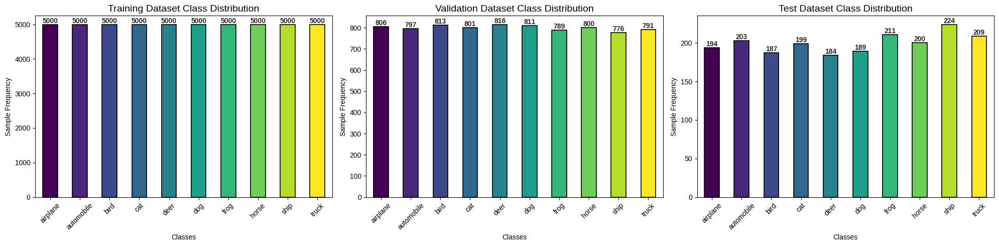

In [ ]:
# Extract labels and convert to pandas Series
train_labels = y_train
train_distribution = pd.Series(train_labels).value_counts().sort_index()
train_distribution.index = class_names

# Extract and process validation labels
val_labels = y_val
val_distribution = pd.Series(val_labels).value_counts().sort_index()
val_distribution.index = class_names

# Extract and process test labels
test_labels = y_test
test_distribution = pd.Series(test_labels).value_counts().sort_index()
test_distribution.index = class_names

# Create figure with subplots
fig, (ax1, ax2, ax3) = plt.subplots(
    nrows=1,
    ncols=3,
    figsize=(20, 5)
)

# Configure plot style
plt.style.use('seaborn-v0_8-whitegrid')

# Color palette for consistent visualization
color_palette = plt.cm.viridis(np.linspace(0, 1, len(class_names)))

# Plot Training Dataset Distribution
train_distribution.plot(
    kind='bar',
    ax=ax1,
    color=color_palette,
    edgecolor='black',
    linewidth=1.2,
    grid=False
)
ax1.set_title('Training Dataset Class Distribution', fontsize=14)
ax1.set_xlabel('Classes', fontsize=10)
ax1.set_ylabel('Sample Frequency', fontsize=10)
ax1.tick_params(axis='x', rotation=45)

# Add value labels for training distribution
for i, v in enumerate(train_distribution):
    ax1.text(
        i,
        v,
        str(v),
        ha='center',
        va='bottom',
        fontweight='bold'
    )

# Plot Validation Dataset Distribution
val_distribution.plot(
    kind='bar',
    ax=ax2,
    color=color_palette,
    edgecolor='black',
    linewidth=1.2,
    grid=False
)
ax2.set_title('Validation Dataset Class Distribution', fontsize=14)
ax2.set_xlabel('Classes', fontsize=10)
ax2.set_ylabel('Sample Frequency', fontsize=10)
ax2.tick_params(axis='x', rotation=45)

# Add value labels for validation distribution
for i, v in enumerate(val_distribution):
    ax2.text(
        i,
        v,
        str(v),
        ha='center',
        va='bottom',
        fontweight='bold'
    )

# Plot Validation Dataset Distribution
test_distribution.plot(
    kind='bar',
    ax=ax3,
    color=color_palette,
    edgecolor='black',
    linewidth=1.2,
    grid=False
)
ax3.set_title('Test Dataset Class Distribution', fontsize=14)
ax3.set_xlabel('Classes', fontsize=10)
ax3.set_ylabel('Sample Frequency', fontsize=10)
ax3.tick_params(axis='x', rotation=45)

# Add value labels for validation distribution
for i, v in enumerate(test_distribution):
    ax3.text(
        i,
        v,
        str(v),
        ha='center',
        va='bottom',
        fontweight='bold'
    )

plt.tight_layout()
plt.show()

### Visualizing Data

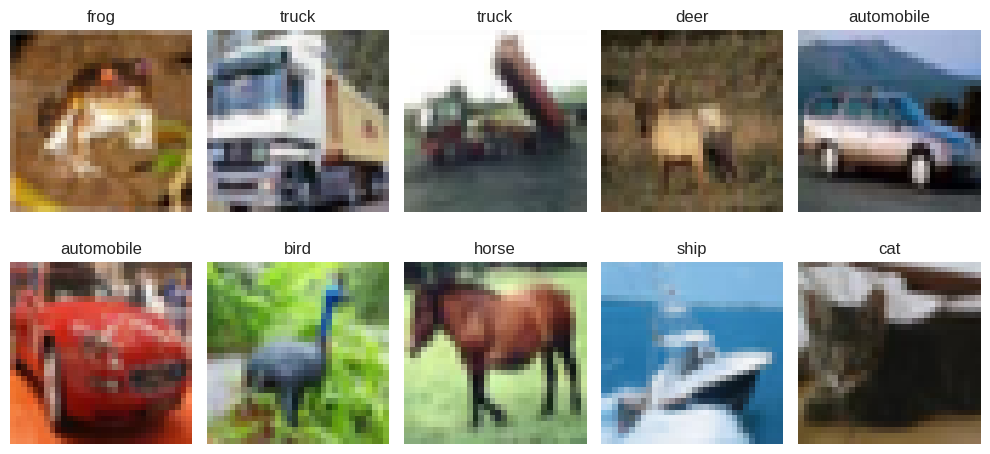

In [ ]:
fig, axes = plt.subplots(2,5, figsize=(10,5))

axes = axes.flatten()
for i, ax in enumerate(axes):
  ax.imshow(x_train[i])
  ax.set_title(class_names[y_train[i]])
  ax.axis('off')

plt.tight_layout()
plt.show()

### Preprocessing

In [ ]:
def preprocess() -> Tuple[Dataset, Dataset, Dataset]:
  train_transfrom = transforms.Compose([
      transforms.Resize((232, 232)),
      transforms.RandomCrop((224, 224)),
      transforms.RandomHorizontalFlip(p=0.5),
      transforms.ToTensor(),
      transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
  ])

  test_transform = transforms.Compose([
      transforms.Resize((232, 232)),
      transforms.CenterCrop((224, 224)),
      transforms.ToTensor(),
      transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
  ])

  train_dataset = CIFAR10(root='./data/processsed', train=True, download=True, transform=train_transfrom)
  test_dataset = CIFAR10(root='./data/processsed', train=False, download=True, transform=test_transform)

  split_point = math.floor(len(test_dataset) * 0.8)
  val_dataset = torch.utils.data.Subset(test_dataset, range(split_point))
  test_dataset = torch.utils.data.Subset(test_dataset, range(split_point, len(test_dataset)))

  return train_dataset, val_dataset, test_dataset

In [ ]:
# Log function for wandb
# todo: not working yet
def preprocess_and_log() -> None:
  print('Preprocessing Dataset ...')
  with wandb.init(
      entity='amiraaz',
      project='Normalization Techniques and Gradient Dynamics',
      job_type='preprocess-and-log-dataset'
  ) as run:

    artifact = run.use_artifact('amiraaz/Normalization Techniques and Gradient Dynamics/CIFAR10_Dataset_Raw:v1', type='dataset') # Just for creating a good graph in W&B
    raw_dataset_dir = artifact.download()

    datasets = preprocess()
    names = ['Training Set', 'Validation Set', 'Test Set']
    train, val, test = datasets

    processed_artifact = wandb.Artifact(
        name='CIFAR10_Dataset_Processed',
        type='dataset',
        description='CIFAR10 dataset with applied transfroms(Resizing, Augmentation and Normalization)',
        metadata={
            'train_size': len(train),
            'validation_size': len(val),
            'test_size': len(test),
            'souruce': 'torchvision.datasets.CIFAR10'
        }
    )

    for name, data in zip(names, datasets):
      with processed_artifact.new_file(f'{name}.pt', mode='wb') as file:
        X, y = data.tensors
        torch.save((X, y), file)

    run.log_artifact(processed_artifact)

    print('___ Dataset preprocessed and logged to W&B ___')

### Defining Dataloader

In [ ]:
train_dataset, val_dataset, test_dataset = preprocess()

train_dataloader = DataLoader(train_dataset, batch_size=config['batch_size'], shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=config['batch_size'], shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=config['batch_size'], shuffle=False)

100%|██████████| 170M/170M [00:13<00:00, 12.9MB/s]


## Base Model Setup

In [ ]:
!pip install torchinfo

In [ ]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from torchvision.models import mobilenet_v2

from torchinfo import summary

### MobilNetV2 Network Summary

In [ ]:
model = mobilenet_v2(weights='IMAGENET1K_V1')
summary(model, input_size=(1, 3, 224, 224))

Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 195MB/s]


Layer (type:depth-idx)                             Output Shape              Param #
MobileNetV2                                        [1, 1000]                 --
├─Sequential: 1-1                                  [1, 1280, 7, 7]           --
│    └─Conv2dNormActivation: 2-1                   [1, 32, 112, 112]         --
│    │    └─Conv2d: 3-1                            [1, 32, 112, 112]         864
│    │    └─BatchNorm2d: 3-2                       [1, 32, 112, 112]         64
│    │    └─ReLU6: 3-3                             [1, 32, 112, 112]         --
│    └─InvertedResidual: 2-2                       [1, 16, 112, 112]         --
│    │    └─Sequential: 3-4                        [1, 16, 112, 112]         896
│    └─InvertedResidual: 2-3                       [1, 24, 56, 56]           --
│    │    └─Sequential: 3-5                        [1, 24, 56, 56]           5,136
│    └─InvertedResidual: 2-4                       [1, 24, 56, 56]           --
│    │    └─Sequential: 3-6   

In [ ]:
#Default Classifier Head of model
model.classifier

Sequential(
  (0): Dropout(p=0.2, inplace=False)
  (1): Linear(in_features=1280, out_features=1000, bias=True)
)

### Base Line Adaptation Head


1.   Global Avg Pooling
2.   FC layer
3.   BatchNorm
4.   ReLU

In [ ]:
class BaseLineAdaptationHead(nn.Module):
  def __init__(self, input_features=1280, num_classes=10, dropout_rate=0.5):
    super(BaseLineAdaptationHead, self).__init__()
    self.global_avg_pool = nn.AdaptiveAvgPool2d(1)
    self.fc1 = nn.Linear(input_features, 256)
    self.dropout = nn.Dropout(dropout_rate)
    self.fc2 = nn.Linear(256, num_classes)

  def forward(self, x):
    x = self.global_avg_pool(x)
    x = torch.flatten(x, start_dim=1)
    x = self.fc1(x)
    x = F.relu(x)
    x = self.dropout(x)
    x = self.fc2(x)
    return x

### Freezing Backbone Gradients

In [ ]:
def freeze_params(model):
  """
  this method can be used to freeze the parameters of the model(or a component of the model, e.g. backbone).
  """
  for param in model.parameters():
      param.requires_grad = False

### Defining Model


In [ ]:
def create_orig_model(num_classes=10):
  """
  This function returns the backbone and classifier head.

  Note: Backbone grads are disabled excpet the last conv layer.
  """
  model = mobilenet_v2(weights='IMAGENET1K_V1')

  # Extract backbone
  features = model.features
  freeze_params(features[:18]) # Disabling grad calculation for all layers except last conv layer of backbone

  # Extract backbone head
  classifier = model.classifier
  return features, classifier

In [ ]:
backbone, _ = create_orig_model()

test_model = nn.Sequential(
    backbone,
    BaseLineAdaptationHead()
)
summary(test_model, input_size=(10, 3, 224, 224))

Layer (type:depth-idx)                             Output Shape              Param #
Sequential                                         [10, 10]                  --
├─Sequential: 1-1                                  [10, 1280, 7, 7]          --
│    └─Conv2dNormActivation: 2-1                   [10, 32, 112, 112]        --
│    │    └─Conv2d: 3-1                            [10, 32, 112, 112]        (864)
│    │    └─BatchNorm2d: 3-2                       [10, 32, 112, 112]        (64)
│    │    └─ReLU6: 3-3                             [10, 32, 112, 112]        --
│    └─InvertedResidual: 2-2                       [10, 16, 112, 112]        --
│    │    └─Sequential: 3-4                        [10, 16, 112, 112]        (896)
│    └─InvertedResidual: 2-3                       [10, 24, 56, 56]          --
│    │    └─Sequential: 3-5                        [10, 24, 56, 56]          (5,136)
│    └─InvertedResidual: 2-4                       [10, 24, 56, 56]          --
│    │    └─Sequential

### Testing Pipeline

In [ ]:
# Checking params of backbone to be frozan except last conv
for name, param in test_model[0].named_parameters():
  if param.requires_grad == False:
    continue
  elif '18' in name:
    print("_____Active Layers_____")
    print(name)
    continue
  else:
     raise Exception(f"!!! Grad Calculation for Layer {name} is NOT Disabled !!!")

print('\nBackbone Model is Frozen Except Last Conv Layer...')

_____Active Layers_____
18.0.weight
_____Active Layers_____
18.1.weight
_____Active Layers_____
18.1.bias

Backbone Model is Frozen Except Last Conv Layer...


In [ ]:
# Checking params of backbone
for name, param in test_model[1].named_parameters():
  assert param.requires_grad == True, f"{name} is frozen"
print('Classifier head is Activated ...')

Classifier head is Activated ...


In [ ]:
def test_pipeline(model):
  """
  A pipeline varifier function.
  """
  device = config['device']

  model = model.to(device)

  input_data = torch.randn(1, 3, 224, 224).to(device)

  with torch.set_grad_enabled(True):
    output = model(input_data)

    example_target = torch.randint(0, 10, (1,)).to(device) # Generating random number between 0 and 10 as a dummy taget class
    loss = nn.CrossEntropyLoss()(output, example_target) # Computing Loss with X-Entropy

    loss.backward()

  # Tesing Section
  print("<------------------- Checking Pipeline ------------------->")
  print()

  print(f"TEST 1: Output Dimension Match")

  print(f"Passed :)") if output.shape == torch.Size([1, 10]) else print(f"Failed :(")
  print()

  print(f"TEST 2: Loss None-Negativeness Check")
  print(f"Passed :)") if loss.item() > 0 else print(f"Failed :(")
  print()

  print(f"TEST 3: Backbone Model's Grads are Disable (Except Last Conv)")
  print(f"Failed :(") if any(p.grad is not None for p in list(model[0].children())[-3].parameters()) else print(f"Passed :)")
  print()

  print(f"TEST 4: Last Conv's Grads of Backbone are Enable")
  print(f"Failed :(") if any(p.grad is None for p in list(model[0].children())[-1].parameters()) else print(f"Passed :)")
  print()

  print(f"TEST 5: Adaptation Head Model's Grads are Enable")
  print(f"Failed :(") if any(p.grad is None for p in list(model[1].children())[0].parameters()) else print(f"Passed :)")
  print()

In [ ]:
test_pipeline(test_model)

<------------------- Checking Pipeline ------------------->

TEST 1: Output Dimension Match
Passed :)

TEST 2: Loss None-Negativeness Check
Passed :)

TEST 3: Backbone Model's Grads are Disable (Except Last Conv)
Passed :)

TEST 4: Last Conv's Grads of Backbone are Enable
Passed :)

TEST 5: Adaptation Head Model's Grads are Enable
Passed :)



## Implementing Normalization Variants

### Batch Normalization Head

In [ ]:
class BatchNormHead(nn.Module):
  def __init__(self, input_features=1280, num_classes=10, dropout_rate=0.5):
    super(BatchNormHead, self).__init__()
    self.global_pool = nn.AdaptiveAvgPool2d(1)
    self.fc1 = nn.Linear(input_features, 256)
    self.bn1 = nn.BatchNorm1d(256) # Added component w.r.t. baseLine
    self.dropout = nn.Dropout(dropout_rate)
    self.fc2 = nn.Linear(256, 10)

  def forward(self, x):
    x = self.global_pool(x)
    x = torch.flatten(x, start_dim=1)
    x = self.fc1(x)
    x = self.bn1(x)
    x = F.relu(x) # ReLU activation
    x = self.dropout(x)
    x = self.fc2(x)
    return x

### Layer Normalization Head

In [ ]:
class LayerNormHead(nn.Module):
  def __init__(self, input_features=1280, num_classes=10, dropout_rate=0.5):
    super(LayerNormHead, self).__init__()
    self.global_pool = nn.AdaptiveAvgPool2d(1)
    self.fc1 = nn.Linear(input_features, 256)
    self.ln1 = nn.LayerNorm(256) # Added component w.r.t. baseLine
    self.dropout = nn.Dropout(dropout_rate)
    self.fc2 = nn.Linear(256, num_classes)

  def forward(self, x):
    x = self.global_pool(x)
    x = torch.flatten(x, 1)
    x = self.fc1(x)
    x = self.ln1(x)
    x = F.relu(x)
    x = self.dropout(x)
    x = self.fc2(x)
    return x

### Filter Response Normalization

In [ ]:
class FilterResponseNorm1D(nn.Module):
  def __init__(self, num_features, epsilon=1e-6):
    """
        Filter Response Normalization Layer for 1D input.

        Args:
            num_features (int): Number of features in the input tensor.
            epsilon (float): epsilon value used for numerical stability.
        """
    super(FilterResponseNorm1D, self).__init__()
    self.eps = epsilon
    self.gamma = nn.Parameter(torch.ones(1, num_features)) # learnable scalers
    self.beta = nn.Parameter(torch.zeros(1, num_features)) # learnable shifters

  def forward(self, x):
    nu2 = torch.mean(x.pow(2), dim=1, keepdim=True) # mean over features
    nu = torch.sqrt(nu2 + self.eps)

    x_normalized = (x / nu) * self.gamma + self.beta
    return x_normalized

In [ ]:
class TLU(nn.Module):
  def __init__(self, num_channels, initial_tau=0.0):
    """
  Thresholded Linear Unit (TLU) activation function.

  Args:
      num_channels (int): Number of channels in the input tensor.
      initial_tau (float or torch.Tensor): Initial value for the tau parameter.
          If a float, it will be used to initialize all channel taus.
          If a torch.Tensor, it should have shape (num_channels,).
    """
    super().__init__()
    if isinstance(initial_tau, float):
        self._tau = torch.full((1, num_channels, 1, 1), initial_tau)

    elif isinstance(initial_tau, torch.Tensor):
        if initial_tau.shape != (num_channels,):
            raise ValueError(f"initial_tau should have shape ({num_channels},) but got {initial_tau.shape}")

        self._tau = initial_tau.view(1, num_channels, 1, 1)
    else:
        raise TypeError("initial_tau should be a float or a torch.Tensor")

    self.register_buffer('tau', self._tau)

  def forward(self, x):
    return torch.maximum(x, self.tau)

In [ ]:
class FRNHead(nn.Module):
  def __init__(self, input_features=1280, num_classes=10, dropout_rate=0.5, use_tlu=False):
    super(FRNHead, self).__init__()
    self.global_pool = nn.AdaptiveAvgPool2d(1)
    self.fc1 = nn.Linear(input_features, 256)
    self.frn1 = FilterResponseNorm1D(256) # Added component w.r.t. baseLine
    self.dropout = nn.Dropout(dropout_rate)
    self.fc2 = nn.Linear(256, num_classes)

    if use_tlu:
      self.activation = TLU(256)
    else:
      self.activation = nn.ReLU(inplace=True)

  def forward(self, x):
    x = self.global_pool(x)
    x = torch.flatten(x, 1)
    x = self.fc1(x)
    x = self.frn1(x)
    x = self.activation(x)
    x = self.dropout(x)
    x = self.fc2(x)
    return x


### Factory Function

In [ ]:
def create_adaptation_head(norm_type: str, input_features=1280, dropout_rate=0.5, num_classes=10):
  if norm_type == 'batch':
    return BatchNormHead(input_features=input_features, num_classes=num_classes, dropout_rate=dropout_rate)
  elif norm_type == 'layer':
    return LayerNormHead(input_features=input_features, num_classes=num_classes, dropout_rate=dropout_rate)
  elif norm_type == 'frn':
    return FRNHead(input_features=input_features, num_classes=num_classes, dropout_rate=dropout_rate)
  elif norm_type == 'baseline':
    return BaseLineAdaptationHead(input_features=input_features, num_classes=num_classes, dropout_rate=dropout_rate)
  else:
    raise ValueError(f"Unsupported normalization type: {norm_type}")

### Transfer Model Class

In [ ]:
class TransferModel(nn.Module):
  def __init__(self, base_model: nn.Module, adaptation_head: nn.Module):
    super(TransferModel, self).__init__()
    self.base_model = base_model
    self.adaptation_head = adaptation_head

  def forward(self, x):
    z = self.base_model(x)
    y = self.adaptation_head(z)
    return y # output shape:

### Defining Transfer Models

In [ ]:
# Initializing models
backbone, _ = create_orig_model() # freezed backbone

# Baseline Transfer Model
bl_head = create_adaptation_head(norm_type='baseline')
model_bl = TransferModel(base_model=copy.deepcopy(backbone), adaptation_head=bl_head)

# BN Transfer Model
bn_head = create_adaptation_head(norm_type='batch')
model_bn = TransferModel(base_model=copy.deepcopy(backbone), adaptation_head=bn_head)

# LN Transfer Model
ln_head = create_adaptation_head(norm_type='layer')
model_ln = TransferModel(base_model=copy.deepcopy(backbone), adaptation_head=ln_head)

# FRN Transfer Model
frn_head = create_adaptation_head(norm_type='frn')
model_frn = TransferModel(base_model=copy.deepcopy(backbone), adaptation_head=frn_head)

### Validating Heads

In [ ]:
def test_pipeline(model, batch_size=8):
  """
  A pipeline varifier function.
  """
  device = config['device']

  model = model.to(device)

  input_data = torch.randn(batch_size, 3, 224, 224).to(device)

  with torch.set_grad_enabled(True):
    output = model(input_data)

    example_target = torch.randint(0, 10, (batch_size,)).to(device) # Generating random number between 0 and 10 as a dummy taget class
    loss = nn.CrossEntropyLoss()(output, example_target) # Computing Loss with X-Entropy

    loss.backward()

  # Tesing Section
  backbone = model.base_model
  head = model.adaptation_head
  print("<------------------- Checking Pipeline ------------------->")
  print()

  print(f"TEST 1: Output Dimension Match")

  print(f"Passed :)") if output.shape == torch.Size([batch_size, 10]) else print(f"Failed :(")
  print()

  print(f"TEST 2: Loss None-Negativeness Check")
  print(f"Passed :)") if loss.item() > 0 else print(f"Failed :(")
  print()

  print(f"TEST 3: Backbone Model's Grads are Disable (Except Last Conv)")
  print(f"Failed :(") if any(p.grad is not None for p in list(backbone.children())[-3].parameters()) else print(f"Passed :)")
  print()

  print(f"TEST 4: Last Conv's Grads of Backbone are Enable")
  print(f"Failed :(") if any(p.grad is None for p in list(backbone.children())[-1].parameters()) else print(f"Passed :)")
  print()

  print(f"TEST 5: Adaptation Head Model's Grads are Enable")
  print(f"Failed :(") if any(p.grad is None for p in list(head.children())[0].parameters()) else print(f"Passed :)")
  print()

In [ ]:
test_pipeline(model_bl)

<------------------- Checking Pipeline ------------------->

TEST 1: Output Dimension Match
Passed :)

TEST 2: Loss None-Negativeness Check
Passed :)

TEST 3: Backbone Model's Grads are Disable (Except Last Conv)
Passed :)

TEST 4: Last Conv's Grads of Backbone are Enable
Passed :)

TEST 5: Adaptation Head Model's Grads are Enable
Passed :)



In [ ]:
test_pipeline(model_bn)

<------------------- Checking Pipeline ------------------->

TEST 1: Output Dimension Match
Passed :)

TEST 2: Loss None-Negativeness Check
Passed :)

TEST 3: Backbone Model's Grads are Disable (Except Last Conv)
Passed :)

TEST 4: Last Conv's Grads of Backbone are Enable
Passed :)

TEST 5: Adaptation Head Model's Grads are Enable
Passed :)



In [ ]:
test_pipeline(model_ln)

<------------------- Checking Pipeline ------------------->

TEST 1: Output Dimension Match
Passed :)

TEST 2: Loss None-Negativeness Check
Passed :)

TEST 3: Backbone Model's Grads are Disable (Except Last Conv)
Passed :)

TEST 4: Last Conv's Grads of Backbone are Enable
Passed :)

TEST 5: Adaptation Head Model's Grads are Enable
Passed :)



In [ ]:
test_pipeline(model_frn)

<------------------- Checking Pipeline ------------------->

TEST 1: Output Dimension Match
Passed :)

TEST 2: Loss None-Negativeness Check
Passed :)

TEST 3: Backbone Model's Grads are Disable (Except Last Conv)
Passed :)

TEST 4: Last Conv's Grads of Backbone are Enable
Passed :)

TEST 5: Adaptation Head Model's Grads are Enable
Passed :)



## Gradient Analysis Infrastructure

### Gradient Tracking Hook Management

In [ ]:
class GradinetTracker:
  def __init__(self, model, tracked_layers=None):
    self.model = model
    self.gradients = dict()
    self.handles = list()
    self.tracked_layers = tracked_layers
    self.setup_hooks(tracked_layers)

  def reset_gradients(self): #h
    self.gradients = dict()

  def save_gradient(self, layer_name): #h
    def hook(module, grad_input, grad_output): # will be used for modules in tracked layers
      if isinstance(grad_output, tuple):
        self.gradients[layer_name] = [g.detach().cpu() for g in grad_output]
      else:
        self.gradients[layer_name] = grad_output.detach().cpu()
    return hook

  def setup_hooks(self, tracked_layers=None): #h
    self.remove_hooks()
    if tracked_layers is None:
      tracked_layers = {name: module for name, module in self.model.named_modules()}

    for name, module in self.model.named_modules():
      if name in tracked_layers:
        if isinstance(module, nn.Conv2d) or isinstance(module, nn.Linear) or isinstance(module, nn.BatchNorm1d) or isinstance(module, nn.LayerNorm) or isinstance(module, FilterResponseNorm1D):
          self.handles.append(module.register_backward_hook(self.save_gradient(name)))

  def remove_hooks(self): #h
    for handle in self.handles:
      handle.remove()
    self.handles = []

  def calculate_gradient_magnitude(self):#h
    magnitudes = {}
    for name, grads in self.gradients.items():
      if isinstance(grads, list):
        magnitudes[name] = [torch.norm(grad).item() for grad in grads]
      else:
        magnitudes[name] = torch.norm(grads).item()
    return magnitudes

  def calculate_layer_norm(self):#h
    layer_norms = {}
    for name, grads in self.gradients.items():
      if isinstance(grads, list):
        layer_norms[name] = [torch.norm(grad).item() for grad in grads]
      else:
        layer_norms[name] = torch.norm(grads).item()
    return layer_norms

  def log_histograms(self, epoch):#h
    for name, grads in self.gradients.items():
      if isinstance(grads, list):
        for i, grad in enumerate(grads):
          wandb.log({f"gradients/{name}_{i}/histogram": wandb.Histogram(grad)}, step=epoch)
      else:
          wandb.log({f"gradients/{name}/histogram": wandb.Histogram(grads)}, step=epoch)
    self.reset_gradients()

  def log_layer_norms(self, epoch): #h
    layer_norms = self.calculate_layer_norm()
    for name, norm in layer_norms.items():
      if isinstance(norm, list):
        for i, n in enumerate(norm):
          wandb.log({f"gradients/{name}_{i}/norm": n}, step=epoch)
      else:
          wandb.log({f"gradients/{name}/norm": norm}, step=epoch)

  def track(self, epoch):
    self.log_histograms(epoch)
    self.log_layer_norms(epoch)
    self.reset_gradients()

### Varify Gradient Tracker

In [ ]:
# setup W&B
wandb.init(
    project=wandb_config['project'],
    name='test_run_gradient_tracking_21',
    entity='amiraaz'
    )

# definning model
model = TransferModel(base_model=create_orig_model()[0], adaptation_head=create_adaptation_head(norm_type='batch'))

wandb.watch(model)

#dummy config
batch_size = 2
lr = 1e-3
device = config['device']
# defining dummy dataset and dataloader
ddata = torch.randn(16 * batch_size, 3, 32, 32)
dlabel = torch.randint(0, 10, (16 * batch_size,))

dataset = TensorDataset(ddata, dlabel)
dataloader = DataLoader(dataset, batch_size=batch_size)

# inint tracker
tracked_layers = {name: module for name, module in model.named_modules() if isinstance(module, (nn.Conv2d, nn.Linear, nn.BatchNorm1d))}
tracker = GradinetTracker(model, tracked_layers=tracked_layers)

loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=lr)

model.to(device)
model.train()
for i, (inputs, labels) in enumerate(dataloader):
  print(f'Iteration: {i + 1}')
  if i >= 5:
    break

  inputs, labels = inputs.to(device), labels.to(device)

  optimizer.zero_grad()

  outputs = model(inputs)

  loss = loss_fn(outputs, labels)
  loss.backward()

  for name, param in model.named_parameters():
    if param.grad is not None and ('.'.join(name.split('.')[:-1]) in [n for n, _ in tracked_layers.items()]):
      print(f"Gradient of  {name}: {torch.norm(param.grad).item()}") # Inspecting gradient manually and not from tracker

  tracker.track(i + 1)

  optimizer.step()
  print(f'Iteration: {i + 1}, Loss: {loss.item()}')

wandb.finish()

Iteration: 1
Gradient of  base_model.18.0.weight: 923.6681518554688
Gradient of  adaptation_head.fc1.weight: 407.4987487792969
Gradient of  adaptation_head.fc1.bias: 5.2575956942746416e-05
Gradient of  adaptation_head.bn1.weight: 0.40460968017578125
Gradient of  adaptation_head.bn1.bias: 0.40941277146339417
Gradient of  adaptation_head.fc2.weight: 11.032761573791504
Gradient of  adaptation_head.fc2.bias: 0.9617631435394287
Iteration: 1, Loss: 2.651729106903076
Iteration: 2
Gradient of  base_model.18.0.weight: 211.36460876464844
Gradient of  adaptation_head.fc1.weight: 78.68891143798828
Gradient of  adaptation_head.fc1.bias: 4.072001502208877e-06
Gradient of  adaptation_head.bn1.weight: 0.3479405641555786
Gradient of  adaptation_head.bn1.bias: 0.3490462303161621
Gradient of  adaptation_head.fc2.weight: 10.254026412963867
Gradient of  adaptation_head.fc2.bias: 0.6427345275878906
Iteration: 2, Loss: 2.0173075199127197
Iteration: 3
Gradient of  base_model.18.0.weight: 381.4006042480469
Gra

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


## Training Framework

### Training Function

In [ ]:
def train_model(
    model,
    train_loader,
    val_loader,
    optimizer,
    criterion,
    device,
    num_epochs=15,
    use_grad_clip=False,
    clip_value=1.0,
    gradient_tracker=None,
    experiment_name = None
):
  """
  returns last model, train loss of each epoch, validation loss of each epoch, validation accuracy of each epoch
  """

  # Loss of each epoch is saved in list
  train_loss_hist = list()
  val_loss_hist = list()
  val_acc_hist = list()
  for epoch in range(num_epochs):
    train_losses = []

    # Progress bar for local logging
    pb = tqdm(train_loader,
              desc=f'Epoch {epoch +  1}/{num_epochs}',
              leave=True
              )

    model.train()
    for batch_i ,(inputs, labels) in enumerate(train_loader):
      inputs, labels = inputs.to(device), labels.to(device)
      optimizer.zero_grad()

      outputs = model(inputs)

      loss = criterion(outputs, labels)
      loss.backward()

      if use_grad_clip:
        torch.nn.utils.clip_grad_norm_(model.parameters(), clip_value)

      optimizer.step()

      train_losses.append(loss.item())

      # update progress bar
      pb.set_postfix({
          'batch': batch_i + 1
          })
      pb.update()


    # Validation run
    val_loss, val_acc = validate_model(
        model=model,
        val_loader=val_loader,
        criterion=criterion,
        device=device
    )
    # local logging
    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: ..., Val Loss: {val_loss:.4f}, Val Accuracy: {val_acc:.4f}")

    # Clout (W&B) logging

    # train
    wandb.log({
        f"{experiment_name}/train_loss": torch.mean(torch.Tensor(train_losses)).item()
    },
        step=epoch
              )

    # validation
    wandb.log(
        {
            f"{experiment_name}/val_loss": val_loss,
            f"{experiment_name}/val_accuracy": val_acc
        }
    )


    if gradient_tracker:
      gradient_tracker.track(epoch)

    train_loss_hist.append(torch.mean(torch.Tensor(train_losses)).item())
    val_loss_hist.append(val_loss)
    val_acc_hist.append(val_acc)

  return model, train_loss_hist, val_loss_hist, val_acc_hist

### Validation Function

In [ ]:
def validate_model(
    model,
    val_loader,
    criterion,
    device
) -> Tuple[float, float]: # (loss, acc)
  model.eval()
  total_loss = 0.0
  correct_predictions = 0
  total_samples = 0
  with torch.no_grad():
    for inputs, labels in val_loader:
      inputs, labels = inputs.to(device), labels.to(device)
      outputs = model(inputs)
      loss = criterion(outputs, labels)
      total_loss += loss.item() * inputs.size(0)
      _, predicted = torch.max(outputs, 1)
      correct_predictions += (predicted == labels).sum().item()
      total_samples += labels.size(0)
  avg_loss = total_loss / total_samples
  accuracy = correct_predictions / total_samples
  return avg_loss, accuracy

### Experiment Manager

In [ ]:
class ExperimentManager:
  def __init__(self, save_dir='./experiments'):
    self.save_dir = save_dir
    os.makedirs(save_dir, exist_ok=True)
    self.experiments = dict()
    self.resume_state= None # This is a dict with shape used save_dict() method, utilized for storing resuming an intrrupted training loop

  def _load_state(self, artifact_name, model, optimizer=None, device='cuda'):
    """
    Load model checkpoint from W&B Artifact.
    """
    try:
      artifact = wandb.use_artifact(artifact_name, type='model')
      artifact_dir = artifact.download()

      files = [f for f in os.listdir(artifact_dir) if f.endswith('.pth')]
      if len(files) == 0:
        raise FileNotFoundError(' No checkpoint file found in artifact')

      checkpoint_path = os.path.join(artifact_dir, files[0])
      state = torch.load(checkpoint_path, map_location=device)

      model.load_state_dict(state['model']) # loading model params from checkpont
      if optimizer and 'optimizer' in state:
        optimizer.load_state_dict(state['optimizer']) # loading optimizer params from checkpont

      return {
          'epoch': state.get('epoch', 0),
          'config': state.get('config', dict()),
          'loss': state.get('loss', float('inf'))
      }
    except Exception as e:
      print(f"Error loading checkpoint: {e}")
      return None

  def _save_state(self, model, optimizer, epoch, name, val_loss, is_best=False):
    state = {
        'model': model.state_dict(),
        'optimizer': optimizer.state_dict(),
        'epoch': epoch,
        'config': wandb.config,
        'loss': val_loss
    }

    path = os.path.join(self.save_dir, name, 'checkpoints')
    # making dir
    os.makedirs(path, exist_ok=True)

    # saving checkpoint in directory
    filename = f'checkpoint_{name}_{epoch}' + ('_best' if is_best else '') + '.pth'
    filepath = os.path.join(path, filename)

    torch.save(state, filepath)

    artifact = wandb.Artifact(
        name=f'checkpoint_{name}_{epoch}',
        type='model',
        metadata={
            'epoch': epoch,
            'val_loss': val_loss,
            'best': is_best
        }
    )

    artifact.add_file(filepath)

    # logging artifact to wandb
    wandb.log_artifact(
        artifact,
        aliases=['latest'] + (['best'] if is_best else [])
                       )

  def run_experiment(self, name, model, train_loader, val_loader, **kwargs):
    config = {
        'lr': kwargs.get('lr', 1e-3),
        'device': kwargs.get('device', 'cuda'),
        'num_epochs': kwargs.get('num_epochs', 15),
        'use_grad_clip':kwargs.get('use_grad_clip', False),
        'clip_value': kwargs.get('clip_value', 1.0),
        'batch_size': 64
    }
    wandb.init(
        project=kwargs.get('project', 'my_project'),
        name=name,
        config=config
    )

    # defining W&B metrics
    wandb.define_metric('epoch')


    wandb.define_metric(
        'train_loss',
        summary='min',
        step_metric='epoch'
    )

    wandb.define_metric(
        'val_loss',
        summary='min',
        step_metric='epoch'
    )

    wandb.define_metric(
        'val_accuracy',
        summary='max',
        step_metric='epoch'
    )


    try:
      tracked_layers = {name: module for name, module in model.named_modules() if isinstance(module, (nn.Conv2d, nn.Linear, nn.BatchNorm1d, nn.LayerNorm, FilterResponseNorm1D))}
      tracker = GradinetTracker(model=model, tracked_layers=tracked_layers)

      optimizer = optim.Adam(model.parameters(), lr=config['lr'])
      criterion = nn.CrossEntropyLoss()

      model.to(config['device'])

      last_model, train_loss_hist, val_loss_hist, val_acc_hist = self.train_model(
          model=model,
          train_loader=train_loader,
          val_loader=val_loader,
          optimizer=optimizer,
          criterion=criterion,
          device=config['device'],
          num_epochs=config['num_epochs'],
          use_grad_clip=config['use_grad_clip'],
          clip_value=config['clip_value'],
          gradient_tracker=tracker,
          experiment_name=name
      )
    except Exception as e:
      print(e)
      wandb.finish()
      print('Experiment Crashed, make sure wandb.finish() is called before your next run!')
      return

    wandb.finish()

    self.experiments[name] = {
        'model': last_model,
        'train_loss_hist': train_loss_hist,
        'val_loss_hist': val_loss_hist,
        'val_acc_hist': val_acc_hist
        }
    self.save_results(name=name)

  def train_model(self,
    model,
    train_loader,
    val_loader,
    optimizer,
    criterion,
    device,
    num_epochs=15,
    use_grad_clip=False,
    clip_value=1.0,
    gradient_tracker=None,
    experiment_name=None
  ):
    """
    returns last model, train loss of each epoch, validation loss of each epoch, validation accuracy of each epoch
    """
    print('inside train_model method')
    # Loss of each epoch is saved in list
    train_loss_hist = list()
    val_loss_hist = list()
    val_acc_hist = list()
    best_loss = float('inf')

    for epoch in range(num_epochs):
      train_losses = []

      # Progress bar for local logging
      pb = tqdm(train_loader,
                desc=f'Epoch {epoch +  1}/{num_epochs}',
                leave=True
                )

      model.train()
      for batch_i ,(inputs, labels) in enumerate(train_loader):
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        if use_grad_clip:
          torch.nn.utils.clip_grad_norm_(model.parameters(), clip_value)
        optimizer.step()

        train_losses.append(loss.item())
        # update progress bar
        pb.set_postfix({
            'batch': batch_i + 1
            })
        pb.update()
      # Validation run
      val_loss, val_acc = self.validate_model(
          model=model,
          val_loader=val_loader,
          criterion=criterion,
          device=device
      )
      # local logging
      print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: , Val Loss: {val_loss:.4f}, Val Accuracy: {val_acc:.4f}")

      # W&B checkpoint logging
      if (epoch + 1) % 5 == 0 or (val_loss < (best_loss - 0.05)): # saving checkpoint for every 5 epoch
        is_best = val_loss < (best_loss - 0.05)

        if is_best:
          best_loss = val_loss
        self._save_state(
            model=model,
            optimizer=optimizer,
            epoch=epoch,
            name=experiment_name,
            val_loss=val_loss,
            is_best=is_best
        )

      # logging to wandb
      wandb.log(
          {
              'epoch': epoch,
              'train_loss': torch.mean(torch.Tensor(train_losses)).item(),
              "val_loss": val_loss,
              "val_accuracy": val_acc
          }
      , step=epoch)

      if gradient_tracker:
        gradient_tracker.track(epoch)
      train_loss_hist.append(torch.mean(torch.Tensor(train_losses)).item())
      val_loss_hist.append(val_loss)
      val_acc_hist.append(val_acc)

    return model, train_loss_hist, val_loss_hist, val_acc_hist

  def validate_model(
    self,
    model,
    val_loader,
    criterion,
    device
  ) -> Tuple[float, float]: # (loss, acc)
    model.eval()
    total_loss = 0.0
    correct_predictions = 0
    total_samples = 0
    with torch.no_grad():
      for inputs, labels in val_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        total_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs, 1)
        correct_predictions += (predicted == labels).sum().item()
        total_samples += labels.size(0)
    avg_loss = total_loss / total_samples
    accuracy = correct_predictions / total_samples
    return avg_loss, accuracy


  def save_results(self, name=None):
    """
    Local Saving, Operates in two modes:

    1 - When `name` is `None`, it then saves all the results in the experiments dict.
    2 -  When `name` is not `None`, it saves only the experiment for the corresponding key in experiments dict.
    """
    if name is not None:
      print(f"Saving {name} Experiment ...")
      exp = self.experiments[name]
      os.makedirs(os.path.join(self.save_dir, f'{name}'), exist_ok=True)

      # saving model
      os.makedirs(os.path.join(self.save_dir, f'{name}', 'model'), exist_ok=True)
      torch.save(exp['model'].state_dict(), os.path.join(self.save_dir, f'{name}', 'model', f'{name}_model_last.pth'))

      # saving losses
      os.makedirs(os.path.join(self.save_dir, f'{name}', 'history'), exist_ok=True)
      hist = {
          'epoch': list(range(len(exp['train_loss_hist']))),
          'train_loss_historty': exp['train_loss_hist'],
          'validation_loss_historty': exp['val_loss_hist'],
          'validation_accuracy_history': exp['val_acc_hist']
      }
      with open(os.path.join(self.save_dir, f'{name}', 'history', 'history.json'), 'w') as file:
        json.dump(hist, file)

      print('Experiment Saved ...')
    else:
      print("Saving All Experiments ...")
      for name, exp in self.experiments.items():
        os.makedirs(os.path.join(self.save_dir, f'{name}'), exist_ok=True)

        # saving model
        os.makedirs(os.path.join(self.save_dir, f'{name}', 'model'), exist_ok=True)
        torch.save(exp['model'].state_dict(), os.path.join(self.save_dir, f'{name}', 'model', f'{name}_model.pth'))

        # saving losses
        os.makedirs(os.path.join(self.save_dir, f'{name}', 'model'), exist_ok=True)
        hist = {
            'epoch': list(range(len(exp['train_loss_hist']))),
            'train_loss_hist': exp['train_loss_hist'],
            'validation_loss_histotry': exp['val_loss_hist'],
            'validation_accuracy_history': exp['val_acc_hist']
        }
        with open(os.path.join(self.save_dir, f'{name}', 'history', 'history.json'), 'w') as file:
          json.dump(hist, file)

      print('Experiments Saved ...')

  def load_results(self, path: str = './experiments'): # todo
    """
    Loads all the experiments from the given path to experiments dict.
    """
    pass


In [ ]:
manager = ExperimentManager()

In [ ]:
manager.run_experiment(
    model=model_bl,
    name='test_train_37',
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    lr=1e-3,
    num_epochs=5,
    use_grad_clip=False,
    clip_value=1.0,
    device=config['device'],
    project=wandb_config['project']
)

after inint wandb
after inint epoch
after inint trainloss
after inint val loss
after inint val acc
inside try block
after gradient tracker init
----------- before training -----------
inside train_model method


Epoch 1/5:   0%|          | 0/1563 [00:00<?, ?it/s]

Epoch [1/5], Train Loss: ..., Val Loss: 0.5159, Val Accuracy: 0.8217
before save state
before logging metric to wandb
bafore tracking grad
inside tracking grad
after tracking grad for epoch: 0
after appending losses


Epoch 2/5:   0%|          | 0/1563 [00:00<?, ?it/s]

Epoch [2/5], Train Loss: ..., Val Loss: 0.4932, Val Accuracy: 0.8303
before save state
before logging metric to wandb
bafore tracking grad
inside tracking grad
after tracking grad for epoch: 1
after appending losses


Epoch 3/5:   0%|          | 0/1563 [00:00<?, ?it/s]

Epoch [3/5], Train Loss: ..., Val Loss: 0.4779, Val Accuracy: 0.8363
before save state
before logging metric to wandb
bafore tracking grad
inside tracking grad
after tracking grad for epoch: 2
after appending losses


Epoch 4/5:   0%|          | 0/1563 [00:00<?, ?it/s]

Epoch [4/5], Train Loss: ..., Val Loss: 0.4721, Val Accuracy: 0.8386
before save state
before logging metric to wandb
bafore tracking grad
inside tracking grad
after tracking grad for epoch: 3
after appending losses


Epoch 5/5:   0%|          | 0/1563 [00:00<?, ?it/s]

Epoch [5/5], Train Loss: ..., Val Loss: 0.4615, Val Accuracy: 0.8426
before save state
before logging metric to wandb
bafore tracking grad
inside tracking grad
after tracking grad for epoch: 4
after appending losses
after train model


epoch,▁▃▅▆█
train_loss,█▇▄▂▁
val_accuracy,▁▄▆▇█
val_loss,█▅▃▂▁
epoch,4


Saving test_train_37 Experiment ...
Experiment Saved ...


## Loss Landscape Visualization

### Util Functions

In [ ]:
def get_random_directions(params): # differ
  dir1 = list()
  dir2 = list()

  for param in params:
    v1 = torch.rand_like(param)
    v2 = torch.rand_like(param)

    v1 = v1 / (torch.norm(v1) + 1e-8)
    v2 = v2 / (torch.norm(v2) + 1e-8)

    dir1.append(v1)
    dir2.append(v2)

  return dir1, dir2

In [ ]:
def compute_loss_landscape(
    model,
    dataloader,
    criterion,
    device,
    alpha_range=(-1, 1),
    beta_range=(-1, 1),
    steps=10,
    direction1=None,
    direction2=None,
    param_selector=lambda m: list(m.parameter()) # differ
):
  model = copy.deepcopy(model)
  model.to(device)
  model.eval()

  params = param_selector(model)

  origin_params = [param.detach().clone() for param in params]

  if direction1 is None or direction2 is None:
    direction1, direction2 = get_random_directions(params)

  alphas = np.linspace(alpha_range[0], alpha_range[1], steps)
  betas = np.linspace(beta_range[0], beta_range[1], steps)
  losses = np.zeros((steps, steps))

  for i, beta in enumerate(betas):
    for j, alpha in enumerate(alphas):
      # update loss using p = p* + alpha * dir1 + beta * dir2

      with torch.no_grad():
        for (origin, param, d1, d2) in zip(origin_params, params, direction1, direction2):
          param.copy_(origin + alpha * d1 + beta * d2)

        # Progress bar for local logging
        pb = tqdm(dataloader,
                  leave=True
                  )

        total_loss = 0
        for inputs, targets in dataloader:
          inputs, targets = inputs.to(device), targets.to(device)
          outputs = model(inputs)

          loss = criterion(outputs, targets)
          total_loss += loss.item() * inputs.size(0) # why?

          pb.update()
      losses[i, j] = total_loss / len(dataloader.dataset)

  # Restore origin params to model params
  with torch.no_grad():
      for origin, p in zip(origin_params, params):
          p.copy_(origin)

  return losses, alphas, betas

In [ ]:
def compute_head_loss_landscape(
    model,
    dataloader,
    criterion,
    device,
    steps=10
    ):
  landscape_data = compute_loss_landscape(
      model=model,
      dataloader=dataloader,
      criterion= criterion,
      device=device,
      steps=steps,
      param_selector=lambda m: list(m.adaptation_head.parameters())
  )

  return landscape_data

In [ ]:
def plot_loss_landscape(landscape_data, title='Loss Landscape'):
  losses, alphas, betas = landscape_data
  plt.figure(figsize=(8, 6))
  plt.contourf(betas, alphas, losses, levels=50, cmap='viridis')
  plt.colorbar(label='Loss')
  plt.xlabel('Beta')
  plt.ylabel('Alpha')
  plt.title(title)
  plt.show()

In [ ]:
def plot_loss_landscape_3d(landscape_data, title='3D Loss Landscape', cmap='viridis', elev=45, azim=-60):
    """
    Plot a 3D surface of the loss landscape.

    Parameters:
        landscape_data: Tuple of (losses, alphas, betas)
        title: Title of the plot
        cmap: Matplotlib colormap ('viridis', 'plasma', 'coolwarm', etc.)
        elev: Elevation angle in the z plane
        azim: Azimuth angle in the x,y plane
    """
    losses, alphas, betas = landscape_data
    A, B = np.meshgrid(betas, alphas)  # X=beta, Y=alpha

    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    surf = ax.plot_surface(A, B, losses, cmap=cmap, edgecolor='k', linewidth=0.3, antialiased=True)

    ax.set_title(title, fontsize=14, pad=20)
    ax.set_xlabel('Beta (η)', labelpad=10)
    ax.set_ylabel('Alpha (δ)', labelpad=10)
    ax.set_zlabel('Loss', labelpad=10)

    ax.view_init(elev=elev, azim=azim)

    fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, pad=0.05, label='Loss Value')
    plt.tight_layout()
    plt.show()


### Verifying Loss landscape functions

In [ ]:
dataa = compute_head_loss_landscape(
    model_bn,
    test_dataloader,
    criterion=nn.CrossEntropyLoss(),
    device=config['device'],
    steps=2
)

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

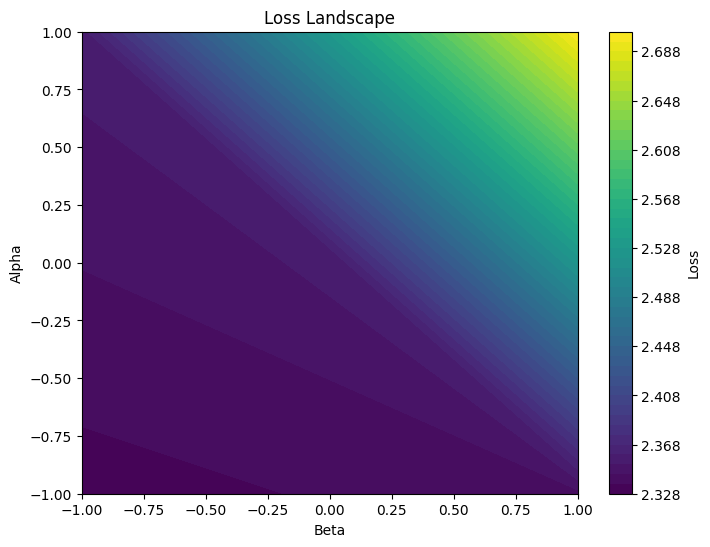

In [ ]:
plot_loss_landscape(dataa)

## Running Experiments

### W&B Configs Rewritten

In [ ]:
wandb_config = {
    'project': 'Normalization Techniques and Gradient Dynamics',
    'entity': 'amiraaz'
}

### Setup Experiment Manager

In [ ]:
manager = ExperimentManager()

In [ ]:
backbone, _ = create_orig_model() # freezed backbone

###  Experiment 1: Training Without Gradient Clipping

In [ ]:
config = {
    'batch_size': 64,
    'lr': 1e-3,
    'epochs': 15,
    'device': 'cuda' if torch.cuda.is_available() else 'cpu',
    'seed': 42,
    'clip_value': 1.0
}

#### Train Baseline

##### **Training**

In [ ]:
# Baseline Transfer Model
bl_head = create_adaptation_head(norm_type='baseline')
model_bl = TransferModel(base_model=copy.deepcopy(backbone), adaptation_head=bl_head)

In [ ]:
manager.run_experiment(
    model=model_bl,
    name='baseline_no_clip',
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    lr=config['lr'],
    num_epochs=config['epochs'],
    use_grad_clip=False,
    clip_value=config['clip_value'],
    device=config['device'],
    project=wandb_config['project']
)

inside train_model method
inside epoch number 0


Epoch 1/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [1/15], Train Loss: , Val Loss: 0.6295, Val Accuracy: 0.7768
inside epoch number 1


Epoch 2/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [2/15], Train Loss: , Val Loss: 0.5851, Val Accuracy: 0.7939
inside epoch number 2


Epoch 3/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [3/15], Train Loss: , Val Loss: 0.5513, Val Accuracy: 0.8055
inside epoch number 3


Epoch 4/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [4/15], Train Loss: , Val Loss: 0.5317, Val Accuracy: 0.8124
inside epoch number 4


Epoch 5/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [5/15], Train Loss: , Val Loss: 0.5155, Val Accuracy: 0.8185
inside epoch number 5


Epoch 6/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [6/15], Train Loss: , Val Loss: 0.5101, Val Accuracy: 0.8216
inside epoch number 6


Epoch 7/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [7/15], Train Loss: , Val Loss: 0.5033, Val Accuracy: 0.8243
inside epoch number 7


Epoch 8/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [8/15], Train Loss: , Val Loss: 0.4808, Val Accuracy: 0.8326
inside epoch number 8


Epoch 9/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [9/15], Train Loss: , Val Loss: 0.4785, Val Accuracy: 0.8355
inside epoch number 9


Epoch 10/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [10/15], Train Loss: , Val Loss: 0.4711, Val Accuracy: 0.8356
inside epoch number 10


Epoch 11/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [11/15], Train Loss: , Val Loss: 0.4516, Val Accuracy: 0.8420
inside epoch number 11


Epoch 12/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [12/15], Train Loss: , Val Loss: 0.4611, Val Accuracy: 0.8440
inside epoch number 12


Epoch 13/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [13/15], Train Loss: , Val Loss: 0.4594, Val Accuracy: 0.8458
inside epoch number 13


Epoch 14/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [14/15], Train Loss: , Val Loss: 0.4667, Val Accuracy: 0.8434
inside epoch number 14


Epoch 15/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [15/15], Train Loss: , Val Loss: 0.4459, Val Accuracy: 0.8476


epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
train_loss,█▆▅▄▄▃▃▃▂▂▂▂▁▁▁
val_accuracy,▁▃▄▅▅▅▆▇▇▇▇████
val_loss,█▆▅▄▄▃▃▂▂▂▁▂▂▂▁
epoch,14


Saving baseline_no_clip Experiment ...
Experiment Saved ...


##### **Loss Plot**

In [ ]:
landscape_data = compute_head_loss_landscape(
    model_bl,
    test_dataloader,
    criterion=nn.CrossEntropyLoss(),
    device=config['device'],
    steps=10
)

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

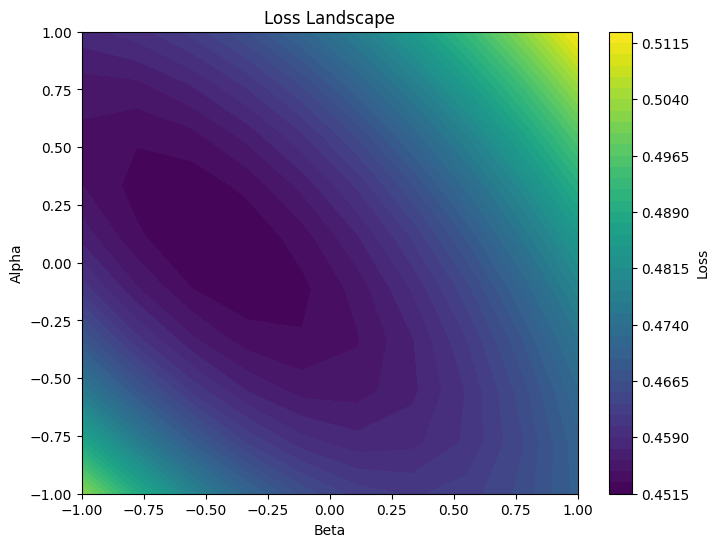

In [ ]:
plot_loss_landscape(landscape_data, title='Baseline 2D Loss Landscape')

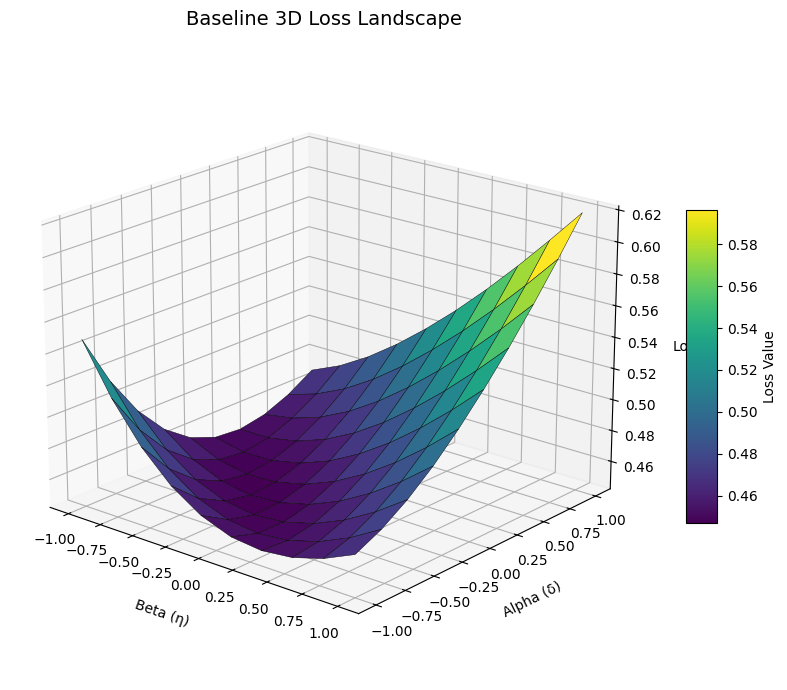

In [ ]:
plot_loss_landscape_3d(landscape_data, title='Baseline 3D Loss Landscape', elev=20, azim=-50)

#### Train BN

##### **Training**

In [ ]:
# BN Transfer Model
bn_head = create_adaptation_head(norm_type='batch')
model_bn = TransferModel(base_model=copy.deepcopy(backbone), adaptation_head=bn_head)

In [ ]:
manager.run_experiment(
    model=model_bn,
    name='batchnorm_no_clip',
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    lr=config['lr'],
    num_epochs=config['epochs'],
    use_grad_clip=False,
    clip_value=config['clip_value'],
    device=config['device'],
    project=wandb_config['project']
)

inside train_model method


Epoch 1/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [1/15], Train Loss: , Val Loss: 0.6055, Val Accuracy: 0.7847


Epoch 2/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [2/15], Train Loss: , Val Loss: 0.5510, Val Accuracy: 0.8069


Epoch 3/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [3/15], Train Loss: , Val Loss: 0.5258, Val Accuracy: 0.8131


Epoch 4/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [4/15], Train Loss: , Val Loss: 0.4963, Val Accuracy: 0.8226


Epoch 5/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [5/15], Train Loss: , Val Loss: 0.4896, Val Accuracy: 0.8286


Epoch 6/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [6/15], Train Loss: , Val Loss: 0.4750, Val Accuracy: 0.8353


Epoch 7/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [7/15], Train Loss: , Val Loss: 0.4677, Val Accuracy: 0.8364


Epoch 8/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [8/15], Train Loss: , Val Loss: 0.4602, Val Accuracy: 0.8429


Epoch 9/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [9/15], Train Loss: , Val Loss: 0.4575, Val Accuracy: 0.8389


Epoch 10/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [10/15], Train Loss: , Val Loss: 0.4491, Val Accuracy: 0.8450


Epoch 11/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [11/15], Train Loss: , Val Loss: 0.4545, Val Accuracy: 0.8431


Epoch 12/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [12/15], Train Loss: , Val Loss: 0.4464, Val Accuracy: 0.8509


Epoch 13/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [13/15], Train Loss: , Val Loss: 0.4558, Val Accuracy: 0.8482


Epoch 14/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [14/15], Train Loss: , Val Loss: 0.4440, Val Accuracy: 0.8536


Epoch 15/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [15/15], Train Loss: , Val Loss: 0.4375, Val Accuracy: 0.8528


epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
train_loss,█▆▅▄▄▃▃▃▃▂▂▂▁▁▁
val_accuracy,▁▃▄▅▅▆▆▇▇▇▇█▇██
val_loss,█▆▅▃▃▃▂▂▂▁▂▁▂▁▁
epoch,14


Saving batchnorm_no_clip Experiment ...
Experiment Saved ...


##### **Loss Plot**

In [ ]:
landscape_data = compute_head_loss_landscape(
    model_bn,
    test_dataloader,
    criterion=nn.CrossEntropyLoss(),
    device=config['device'],
    steps=10
)

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

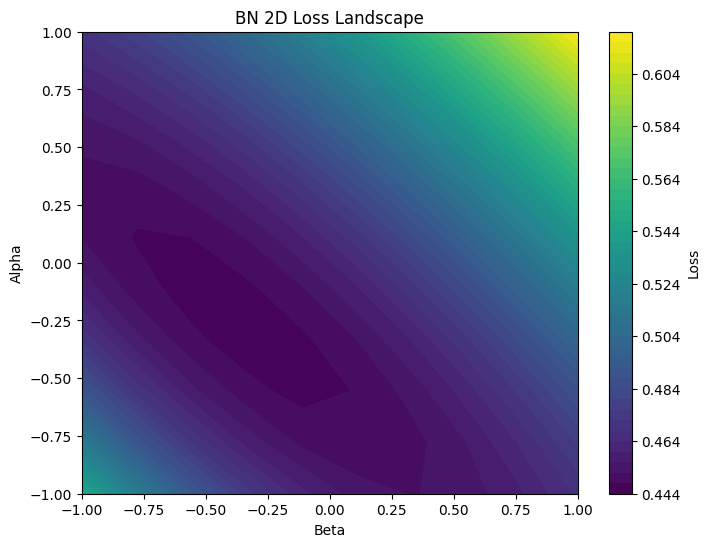

In [ ]:
plot_loss_landscape(landscape_data, title='BN 2D Loss Landscape')

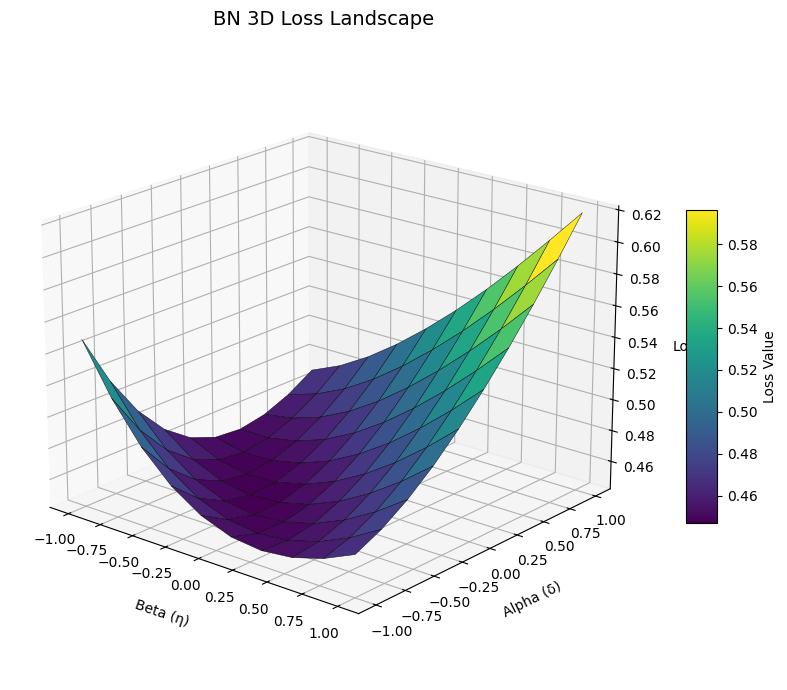

In [ ]:
plot_loss_landscape_3d(landscape_data, title='BN 3D Loss Landscape', elev=20, azim=-50)

#### Train LN

##### **Training**

In [ ]:
# LayerNormHead Transfer Model
ln_head = create_adaptation_head(norm_type='layer')
model_ln = TransferModel(base_model=copy.deepcopy(backbone), adaptation_head=ln_head)

In [ ]:
manager.run_experiment(
    model=model_ln,
    name='layernorm_no_clip',
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    lr=config['lr'],
    num_epochs=config['epochs'],
    use_grad_clip=False,
    clip_value=config['clip_value'],
    device=config['device'],
    project=wandb_config['project']
)

inside train_model method


Epoch 1/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [1/15], Train Loss: , Val Loss: 0.6245, Val Accuracy: 0.7836


Epoch 2/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [2/15], Train Loss: , Val Loss: 0.5746, Val Accuracy: 0.7981


Epoch 3/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [3/15], Train Loss: , Val Loss: 0.5498, Val Accuracy: 0.8083


Epoch 4/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [4/15], Train Loss: , Val Loss: 0.5217, Val Accuracy: 0.8167


Epoch 5/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [5/15], Train Loss: , Val Loss: 0.5060, Val Accuracy: 0.8219


Epoch 6/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [6/15], Train Loss: , Val Loss: 0.5058, Val Accuracy: 0.8216


Epoch 7/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [7/15], Train Loss: , Val Loss: 0.4718, Val Accuracy: 0.8363


Epoch 8/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [8/15], Train Loss: , Val Loss: 0.4768, Val Accuracy: 0.8340


Epoch 9/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [9/15], Train Loss: , Val Loss: 0.4750, Val Accuracy: 0.8347


Epoch 10/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [10/15], Train Loss: , Val Loss: 0.4683, Val Accuracy: 0.8381


Epoch 11/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [11/15], Train Loss: , Val Loss: 0.4487, Val Accuracy: 0.8436


Epoch 12/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [12/15], Train Loss: , Val Loss: 0.4370, Val Accuracy: 0.8521


Epoch 13/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [13/15], Train Loss: , Val Loss: 0.4577, Val Accuracy: 0.8426


Epoch 14/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [14/15], Train Loss: , Val Loss: 0.4367, Val Accuracy: 0.8500


Epoch 15/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [15/15], Train Loss: , Val Loss: 0.4372, Val Accuracy: 0.8492


epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
train_loss,█▆▅▄▄▃▃▃▂▂▂▂▁▁▁
val_accuracy,▁▂▄▄▅▅▆▆▆▇▇█▇██
val_loss,█▆▅▄▄▄▂▂▂▂▁▁▂▁▁
epoch,14


Saving layernorm_no_clip Experiment ...
Experiment Saved ...


##### **Loss Plot**

In [ ]:
landscape_data_ln = compute_head_loss_landscape(
    model_ln,
    test_dataloader,
    criterion=nn.CrossEntropyLoss(),
    device=config['device'],
    steps=10
)

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

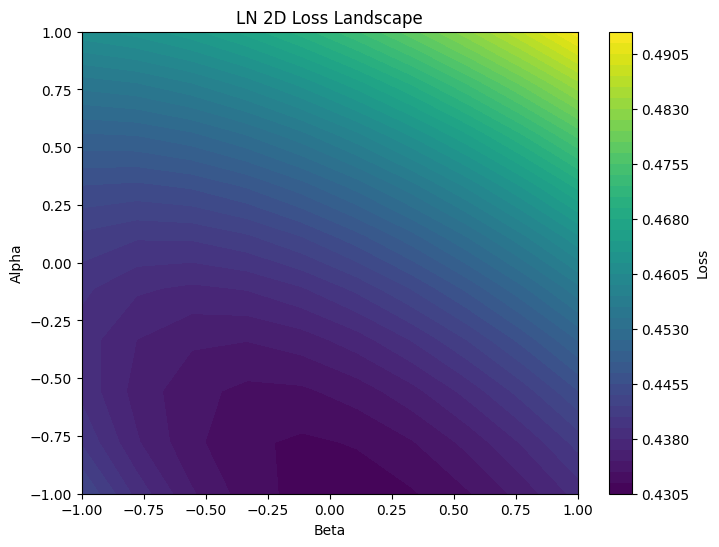

In [ ]:
plot_loss_landscape(landscape_data_ln, title='LN 2D Loss Landscape')

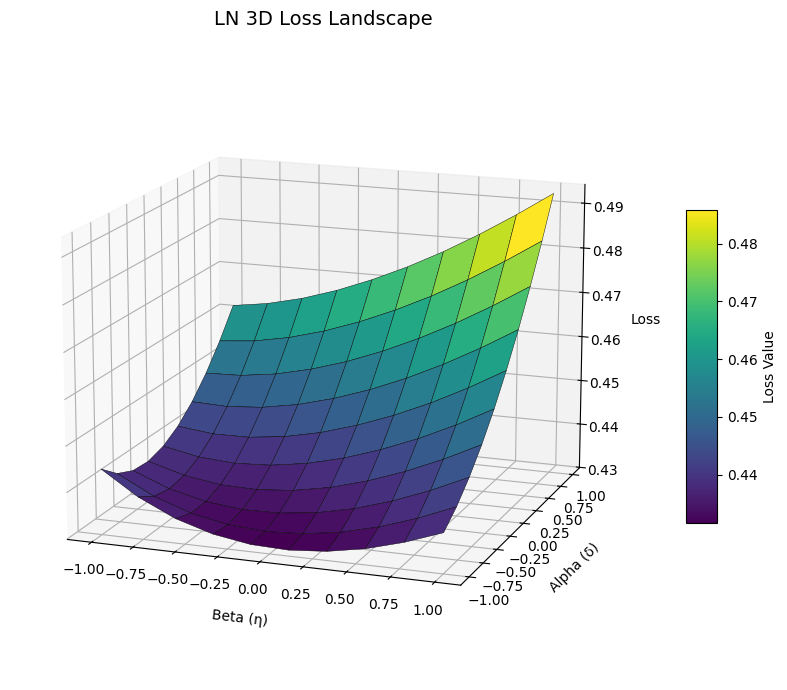

In [ ]:
plot_loss_landscape_3d(landscape_data_ln, title='LN 3D Loss Landscape', elev=15, azim=-70)

#### Train FRN

##### **Training**

In [ ]:
# FRN Transfer Model
frn_head = create_adaptation_head(norm_type='frn')
model_frn = TransferModel(base_model=copy.deepcopy(backbone), adaptation_head=frn_head)

In [ ]:
manager.run_experiment(
    model=model_frn,
    name='frn_no_clip',
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    lr=config['lr'],
    num_epochs=config['epochs'],
    use_grad_clip=False,
    clip_value=config['clip_value'],
    device=config['device'],
    project=wandb_config['project']
)

inside train_model method


Epoch 1/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [1/15], Train Loss: , Val Loss: 0.6316, Val Accuracy: 0.7824


Epoch 2/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [2/15], Train Loss: , Val Loss: 0.5819, Val Accuracy: 0.7987


Epoch 3/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [3/15], Train Loss: , Val Loss: 0.5603, Val Accuracy: 0.8059


Epoch 4/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [4/15], Train Loss: , Val Loss: 0.5363, Val Accuracy: 0.8106


Epoch 5/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [5/15], Train Loss: , Val Loss: 0.5080, Val Accuracy: 0.8203


Epoch 6/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [6/15], Train Loss: , Val Loss: 0.4906, Val Accuracy: 0.8310


Epoch 7/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [7/15], Train Loss: , Val Loss: 0.4829, Val Accuracy: 0.8336


Epoch 8/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [8/15], Train Loss: , Val Loss: 0.4721, Val Accuracy: 0.8377


Epoch 9/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [9/15], Train Loss: , Val Loss: 0.4668, Val Accuracy: 0.8350


Epoch 10/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [10/15], Train Loss: , Val Loss: 0.4662, Val Accuracy: 0.8395


Epoch 11/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [11/15], Train Loss: , Val Loss: 0.4561, Val Accuracy: 0.8413


Epoch 12/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [12/15], Train Loss: , Val Loss: 0.4464, Val Accuracy: 0.8445


Epoch 13/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [13/15], Train Loss: , Val Loss: 0.4456, Val Accuracy: 0.8476


Epoch 14/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [14/15], Train Loss: , Val Loss: 0.4387, Val Accuracy: 0.8489


Epoch 15/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [15/15], Train Loss: , Val Loss: 0.4414, Val Accuracy: 0.8468


epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
train_loss,█▆▅▄▄▃▃▃▂▂▂▂▁▁▁
val_accuracy,▁▃▃▄▅▆▆▇▇▇▇████
val_loss,█▆▅▅▄▃▃▂▂▂▂▁▁▁▁
epoch,14


Saving frn_no_clip Experiment ...
Experiment Saved ...


##### **Loss Plot**

In [ ]:
landscape_data = compute_head_loss_landscape(
    model_frn,
    test_dataloader,
    criterion=nn.CrossEntropyLoss(),
    device=config['device'],
    steps=10
)

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

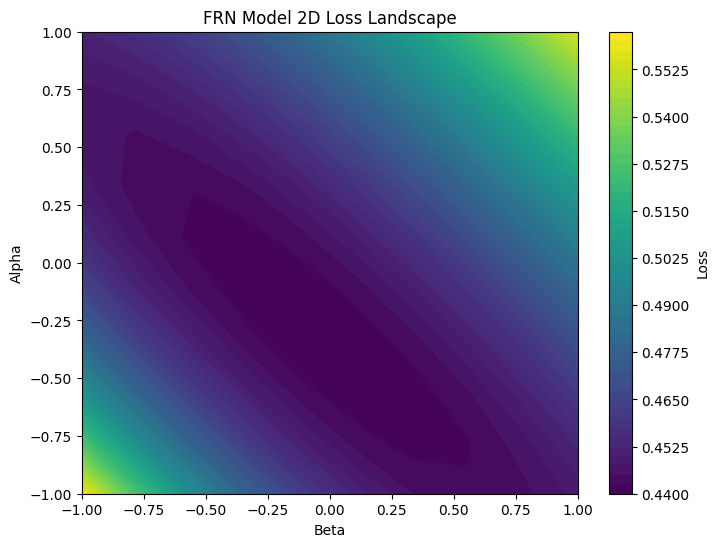

In [ ]:
plot_loss_landscape(landscape_data, title='FRN Model 2D Loss Landscape')

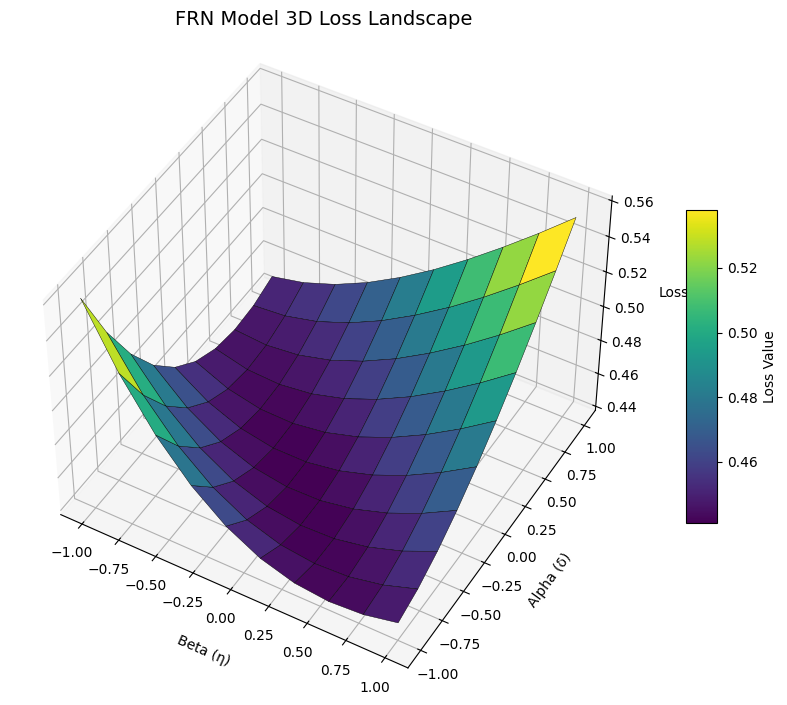

In [ ]:
plot_loss_landscape_3d(landscape_data, title='FRN Model 3D Loss Landscape')

### Experiment 3: Training with With Gradient Clipping

#### Train Baseline

##### **Training**

In [ ]:
# Baseline Transfer Model
bl_head = create_adaptation_head(norm_type='baseline')
model_bl = TransferModel(base_model=copy.deepcopy(backbone), adaptation_head=bl_head)

In [ ]:
manager.run_experiment(
    model=model_bl,
    name='baseline_clip',
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    lr=config['lr'],
    num_epochs=config['epochs'],
    use_grad_clip=True,
    clip_value=config['clip_value'],
    device=config['device'],
    project=wandb_config['project']
)

inside train_model method


Epoch 1/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [1/15], Train Loss: , Val Loss: 0.6500, Val Accuracy: 0.7759


Epoch 2/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [2/15], Train Loss: , Val Loss: 0.5827, Val Accuracy: 0.7947


Epoch 3/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [3/15], Train Loss: , Val Loss: 0.5560, Val Accuracy: 0.8066


Epoch 4/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [4/15], Train Loss: , Val Loss: 0.5299, Val Accuracy: 0.8154


Epoch 5/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [5/15], Train Loss: , Val Loss: 0.5222, Val Accuracy: 0.8179


Epoch 6/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [6/15], Train Loss: , Val Loss: 0.5113, Val Accuracy: 0.8239


Epoch 7/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [7/15], Train Loss: , Val Loss: 0.5038, Val Accuracy: 0.8249


Epoch 8/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [8/15], Train Loss: , Val Loss: 0.4913, Val Accuracy: 0.8304


Epoch 9/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [9/15], Train Loss: , Val Loss: 0.4880, Val Accuracy: 0.8326


Epoch 10/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [10/15], Train Loss: , Val Loss: 0.4696, Val Accuracy: 0.8403


Epoch 11/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [11/15], Train Loss: , Val Loss: 0.4682, Val Accuracy: 0.8399


Epoch 12/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [12/15], Train Loss: , Val Loss: 0.4794, Val Accuracy: 0.8334


Epoch 13/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [13/15], Train Loss: , Val Loss: 0.4635, Val Accuracy: 0.8445


Epoch 14/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [14/15], Train Loss: , Val Loss: 0.4588, Val Accuracy: 0.8491


Epoch 15/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [15/15], Train Loss: , Val Loss: 0.4520, Val Accuracy: 0.8486


epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
train_loss,█▆▅▄▄▄▃▃▃▂▂▂▁▁▁
val_accuracy,▁▃▄▅▅▆▆▆▆▇▇▆███
val_loss,█▆▅▄▃▃▃▂▂▂▂▂▁▁▁
epoch,14


Saving baseline_clip Experiment ...
Experiment Saved ...


##### **Loss Plot**

In [ ]:
landscape_data = compute_head_loss_landscape(
    model_bl,
    test_dataloader,
    criterion=nn.CrossEntropyLoss(),
    device=config['device'],
    steps=10
)

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

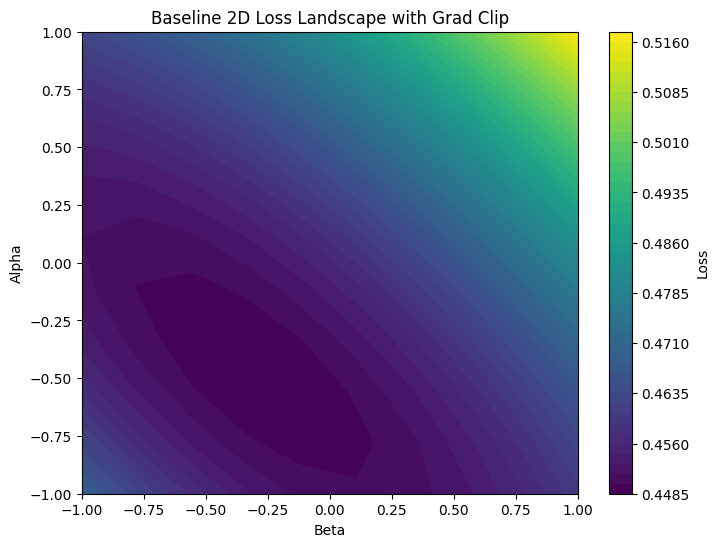

In [ ]:
plot_loss_landscape(landscape_data, title='Baseline 2D Loss Landscape with Grad Clip')

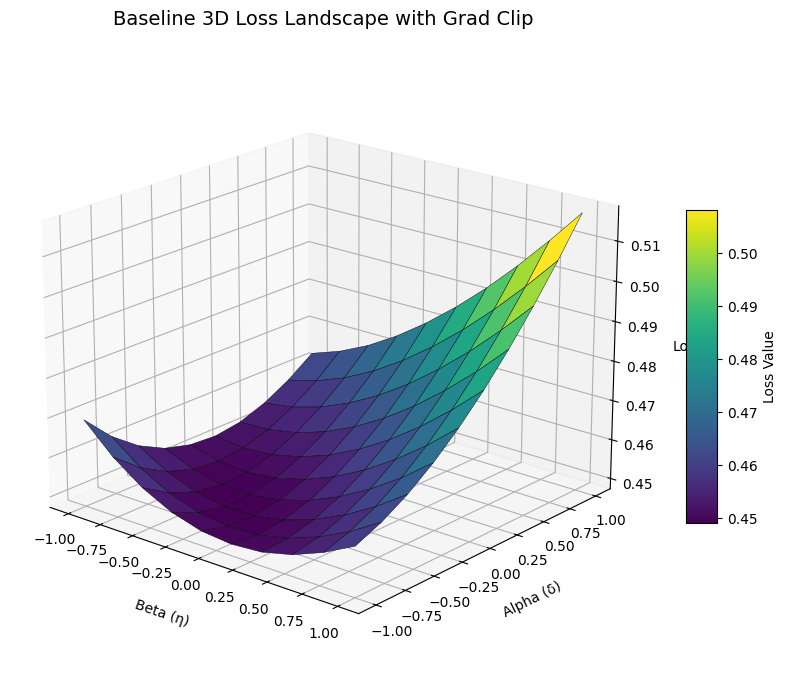

In [ ]:
plot_loss_landscape_3d(landscape_data, title='Baseline 3D Loss Landscape with Grad Clip', elev=20, azim=-50)

#### Train BN

##### **Training**

In [ ]:
# BN Transfer Model
bn_head = create_adaptation_head(norm_type='batch')
model_bn = TransferModel(base_model=copy.deepcopy(backbone), adaptation_head=bn_head)

In [ ]:
manager.run_experiment(
    model=model_bn,
    name='batchnorm_clip',
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    lr=config['lr'],
    num_epochs=config['epochs'],
    use_grad_clip=True,
    clip_value=config['clip_value'],
    device=config['device'],
    project=wandb_config['project']
)

inside train_model method


Epoch 1/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [1/15], Train Loss: , Val Loss: 0.6062, Val Accuracy: 0.7886


Epoch 2/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [2/15], Train Loss: , Val Loss: 0.5499, Val Accuracy: 0.8050


Epoch 3/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [3/15], Train Loss: , Val Loss: 0.5248, Val Accuracy: 0.8149


Epoch 4/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [4/15], Train Loss: , Val Loss: 0.5004, Val Accuracy: 0.8243


Epoch 5/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [5/15], Train Loss: , Val Loss: 0.4891, Val Accuracy: 0.8275


Epoch 6/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [6/15], Train Loss: , Val Loss: 0.4948, Val Accuracy: 0.8267


Epoch 7/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [7/15], Train Loss: , Val Loss: 0.4648, Val Accuracy: 0.8366


Epoch 8/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [8/15], Train Loss: , Val Loss: 0.4705, Val Accuracy: 0.8363


Epoch 9/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [9/15], Train Loss: , Val Loss: 0.4386, Val Accuracy: 0.8474


Epoch 10/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [10/15], Train Loss: , Val Loss: 0.4488, Val Accuracy: 0.8444


Epoch 11/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [11/15], Train Loss: , Val Loss: 0.4492, Val Accuracy: 0.8459


Epoch 12/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [12/15], Train Loss: , Val Loss: 0.4429, Val Accuracy: 0.8450


Epoch 13/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [13/15], Train Loss: , Val Loss: 0.4458, Val Accuracy: 0.8492


Epoch 14/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [14/15], Train Loss: , Val Loss: 0.4493, Val Accuracy: 0.8491


Epoch 15/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [15/15], Train Loss: , Val Loss: 0.4411, Val Accuracy: 0.8511


epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
train_loss,█▆▅▄▄▃▃▃▂▂▂▂▁▁▁
val_accuracy,▁▃▄▅▅▅▆▆█▇▇▇███
val_loss,█▆▅▄▃▃▂▂▁▁▁▁▁▁▁
epoch,14


Saving batchnorm_clip Experiment ...
Experiment Saved ...


##### **Loss Plot**

In [ ]:
landscape_data = compute_head_loss_landscape(
    model_bn,
    test_dataloader,
    criterion=nn.CrossEntropyLoss(),
    device=config['device'],
    steps=10
)

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

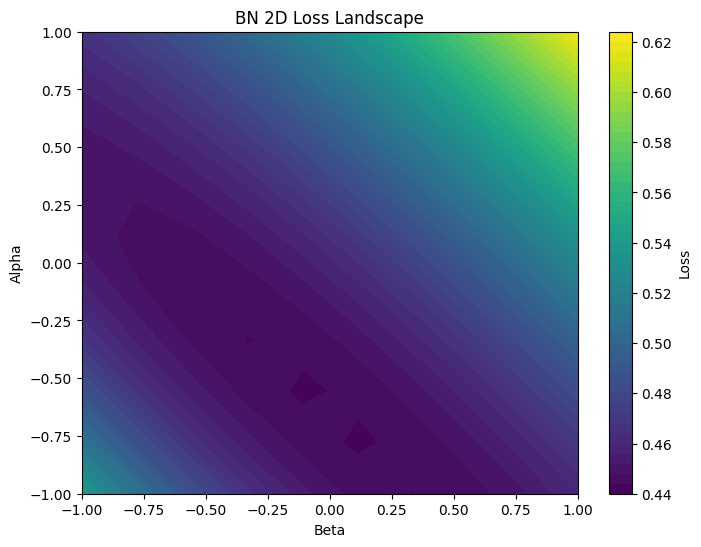

In [ ]:
plot_loss_landscape(landscape_data, title='BN 2D Loss Landscape')

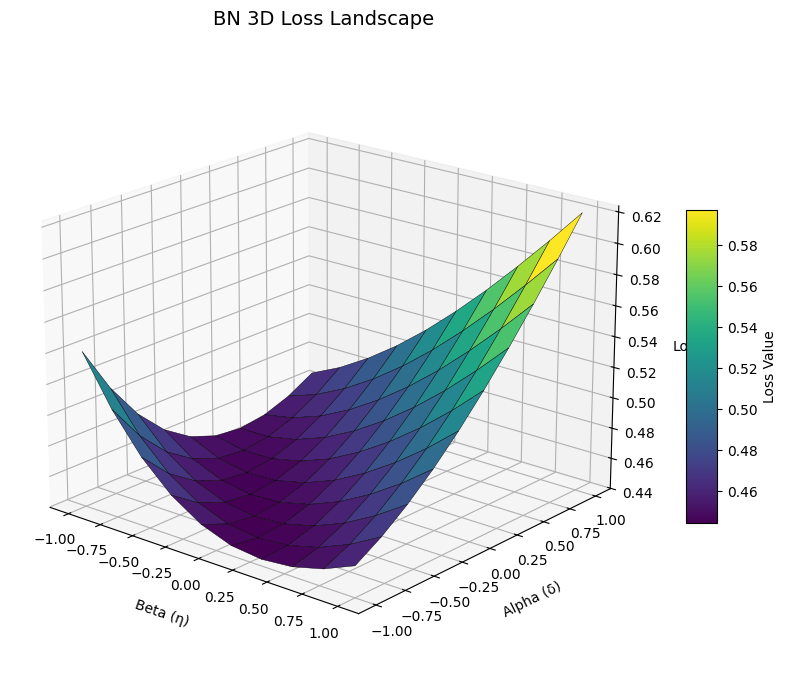

In [ ]:
plot_loss_landscape_3d(landscape_data, title='BN 3D Loss Landscape', elev=20, azim=-50)

#### Train LN

##### **Training**

In [ ]:
# LayerNormHead Transfer Model
ln_head = create_adaptation_head(norm_type='layer')
model_ln = TransferModel(base_model=copy.deepcopy(backbone), adaptation_head=ln_head)

In [ ]:
manager.run_experiment(
    model=model_ln,
    name='layernorm_clip',
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    lr=config['lr'],
    num_epochs=config['epochs'],
    use_grad_clip=True,
    clip_value=config['clip_value'],
    device=config['device'],
    project=wandb_config['project']
)

inside train_model method


Epoch 1/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [1/15], Train Loss: , Val Loss: 0.6260, Val Accuracy: 0.7827


Epoch 2/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [2/15], Train Loss: , Val Loss: 0.5883, Val Accuracy: 0.7950


Epoch 3/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [3/15], Train Loss: , Val Loss: 0.5481, Val Accuracy: 0.8083


Epoch 4/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [4/15], Train Loss: , Val Loss: 0.5264, Val Accuracy: 0.8157


Epoch 5/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [5/15], Train Loss: , Val Loss: 0.4896, Val Accuracy: 0.8279


Epoch 6/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [6/15], Train Loss: , Val Loss: 0.4767, Val Accuracy: 0.8334


Epoch 7/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [7/15], Train Loss: , Val Loss: 0.4831, Val Accuracy: 0.8313


Epoch 8/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [8/15], Train Loss: , Val Loss: 0.4664, Val Accuracy: 0.8323


Epoch 9/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [9/15], Train Loss: , Val Loss: 0.4642, Val Accuracy: 0.8405


Epoch 10/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [10/15], Train Loss: , Val Loss: 0.4592, Val Accuracy: 0.8410


Epoch 11/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [11/15], Train Loss: , Val Loss: 0.4542, Val Accuracy: 0.8430


Epoch 12/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [12/15], Train Loss: , Val Loss: 0.4462, Val Accuracy: 0.8474


Epoch 13/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [13/15], Train Loss: , Val Loss: 0.4492, Val Accuracy: 0.8439


Epoch 14/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [14/15], Train Loss: , Val Loss: 0.4352, Val Accuracy: 0.8512


Epoch 15/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [15/15], Train Loss: , Val Loss: 0.4371, Val Accuracy: 0.8526


epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
train_loss,█▆▅▄▄▃▃▃▂▂▂▂▂▁▁
val_accuracy,▁▂▄▄▆▆▆▆▇▇▇▇▇██
val_loss,█▇▅▄▃▃▃▂▂▂▂▁▂▁▁
epoch,14


Saving layernorm_clip Experiment ...
Experiment Saved ...


##### **Loss Plot**

In [ ]:
model_ln = manager._load_state()

In [ ]:
landscape_data_ln = compute_head_loss_landscape(
    model_ln,
    test_dataloader,
    criterion=nn.CrossEntropyLoss(),
    device=config['device'],
    steps=10
)

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

In [ ]:
plot_loss_landscape(landscape_data_ln, title='LN 2D Loss Landscape')

In [ ]:
plot_loss_landscape_3d(landscape_data_ln, title='LN 3D Loss Landscape', elev=15, azim=-70)

#### Train FRN

##### **Training**

In [ ]:
# FRN Transfer Model
frn_head = create_adaptation_head(norm_type='frn')
model_frn = TransferModel(base_model=copy.deepcopy(backbone), adaptation_head=frn_head)

In [ ]:
manager.run_experiment(
    model=model_frn,
    name='frn_clip',
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    lr=config['lr'],
    num_epochs=config['epochs'],
    use_grad_clip=True,
    clip_value=config['clip_value'],
    device=config['device'],
    project=wandb_config['project']
)

inside train_model method


Epoch 1/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [1/15], Train Loss: , Val Loss: 0.6281, Val Accuracy: 0.7802


Epoch 2/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [2/15], Train Loss: , Val Loss: 0.5716, Val Accuracy: 0.7993


Epoch 3/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [3/15], Train Loss: , Val Loss: 0.5447, Val Accuracy: 0.8103


Epoch 4/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [4/15], Train Loss: , Val Loss: 0.5211, Val Accuracy: 0.8204


Epoch 5/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [5/15], Train Loss: , Val Loss: 0.5012, Val Accuracy: 0.8245


Epoch 6/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [6/15], Train Loss: , Val Loss: 0.5029, Val Accuracy: 0.8241


Epoch 7/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [7/15], Train Loss: , Val Loss: 0.4717, Val Accuracy: 0.8360


Epoch 8/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [8/15], Train Loss: , Val Loss: 0.4711, Val Accuracy: 0.8337


Epoch 9/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [9/15], Train Loss: , Val Loss: 0.4722, Val Accuracy: 0.8347


Epoch 10/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [10/15], Train Loss: , Val Loss: 0.4676, Val Accuracy: 0.8381


Epoch 11/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [11/15], Train Loss: , Val Loss: 0.4523, Val Accuracy: 0.8430


Epoch 12/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [12/15], Train Loss: , Val Loss: 0.4417, Val Accuracy: 0.8509


Epoch 13/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [13/15], Train Loss: , Val Loss: 0.4458, Val Accuracy: 0.8481


Epoch 14/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [14/15], Train Loss: , Val Loss: 0.4391, Val Accuracy: 0.8495


Epoch 15/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [15/15], Train Loss: , Val Loss: 0.4436, Val Accuracy: 0.8481


epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
train_loss,█▆▅▄▄▃▃▃▂▂▂▂▁▁▁
val_accuracy,▁▃▄▅▅▅▇▆▆▇▇████
val_loss,█▆▅▄▃▃▂▂▂▂▁▁▁▁▁
epoch,14


Saving frn_clip Experiment ...
Experiment Saved ...


##### **Loss Plot**

In [ ]:
landscape_data = compute_head_loss_landscape(
    model_frn,
    test_dataloader,
    criterion=nn.CrossEntropyLoss(),
    device=config['device'],
    steps=10
)

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

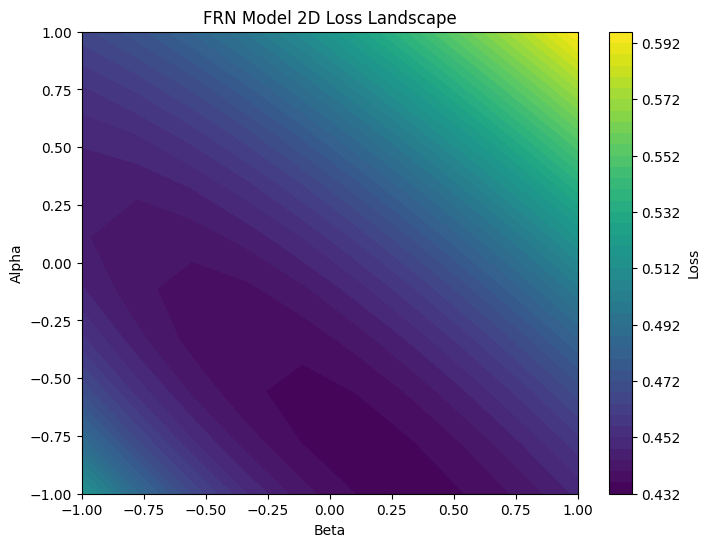

In [ ]:
plot_loss_landscape(landscape_data, title='FRN Model 2D Loss Landscape')

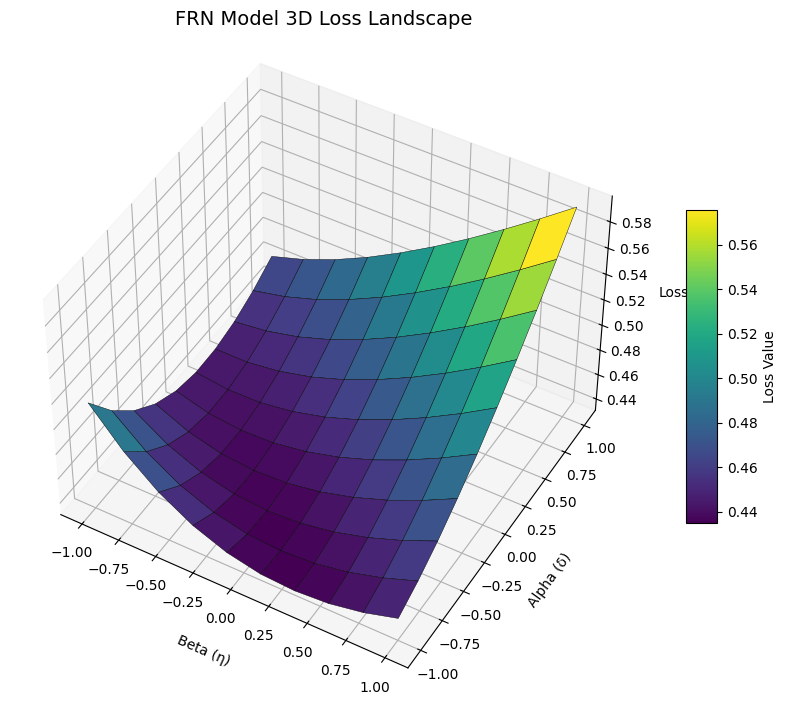

In [ ]:
plot_loss_landscape_3d(landscape_data, title='FRN Model 3D Loss Landscape')

### Experiment 2: Playing with learning rate

In [ ]:
config = {
    'batch_size': 64,
    'lr': 1e-2,
    'epochs': 15,
    'device': 'cuda' if torch.cuda.is_available() else 'cpu',
    'seed': 42,
    'clip_value': 1.0
}

#### Train Baseline

##### **Training**

In [ ]:
# Baseline Transfer Model
bl_head = create_adaptation_head(norm_type='baseline')
model_bl = TransferModel(base_model=copy.deepcopy(backbone), adaptation_head=bl_head)

In [ ]:
manager.run_experiment(
    model=model_bl,
    name='baseline_no_clip_e2',
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    lr=config['lr'],
    num_epochs=config['epochs'],
    use_grad_clip=False,
    clip_value=config['clip_value'],
    device=config['device'],
    project=wandb_config['project']
)

inside train_model method


Epoch 1/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [1/15], Train Loss: , Val Loss: 0.7127, Val Accuracy: 0.7670


Epoch 2/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [2/15], Train Loss: , Val Loss: 0.6219, Val Accuracy: 0.7930


Epoch 3/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [3/15], Train Loss: , Val Loss: 0.5730, Val Accuracy: 0.8075


Epoch 4/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [4/15], Train Loss: , Val Loss: 0.5575, Val Accuracy: 0.8143


Epoch 5/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [5/15], Train Loss: , Val Loss: 0.5289, Val Accuracy: 0.8219


Epoch 6/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [6/15], Train Loss: , Val Loss: 0.5372, Val Accuracy: 0.8150


Epoch 7/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [7/15], Train Loss: , Val Loss: 0.5181, Val Accuracy: 0.8330


Epoch 8/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [8/15], Train Loss: , Val Loss: 0.5293, Val Accuracy: 0.8199


Epoch 9/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [9/15], Train Loss: , Val Loss: 0.5256, Val Accuracy: 0.8310


Epoch 10/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [10/15], Train Loss: , Val Loss: 0.5214, Val Accuracy: 0.8296


Epoch 11/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [11/15], Train Loss: , Val Loss: 0.5003, Val Accuracy: 0.8363


Epoch 12/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [12/15], Train Loss: , Val Loss: 0.5062, Val Accuracy: 0.8327


Epoch 13/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [13/15], Train Loss: , Val Loss: 0.5091, Val Accuracy: 0.8376


Epoch 14/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [14/15], Train Loss: , Val Loss: 0.5515, Val Accuracy: 0.8313


Epoch 15/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [15/15], Train Loss: , Val Loss: 0.5306, Val Accuracy: 0.8357


epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
train_loss,█▅▄▃▃▂▂▂▂▂▂▁▁▁▁
val_accuracy,▁▄▅▆▆▆█▆▇▇███▇█
val_loss,█▅▃▃▂▂▂▂▂▂▁▁▁▃▂
epoch,14


Saving baseline_no_clip_e2 Experiment ...
Experiment Saved ...


#### Train BN

##### **Training**

In [ ]:
# BN Transfer Model
bn_head = create_adaptation_head(norm_type='batch')
model_bn_e2 = TransferModel(base_model=copy.deepcopy(backbone), adaptation_head=bn_head)

In [ ]:
manager.run_experiment(
    model=model_bn_e2,
    name='batchnorm_no_clip_e2',
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    lr=config['lr'],
    num_epochs=config['epochs'],
    use_grad_clip=False,
    clip_value=config['clip_value'],
    device=config['device'],
    project=wandb_config['project']
)

inside train_model method


Epoch 1/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [1/15], Train Loss: , Val Loss: 0.6214, Val Accuracy: 0.7815


Epoch 2/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [2/15], Train Loss: , Val Loss: 0.5666, Val Accuracy: 0.7996


Epoch 3/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [3/15], Train Loss: , Val Loss: 0.5332, Val Accuracy: 0.8157


Epoch 4/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [4/15], Train Loss: , Val Loss: 0.5067, Val Accuracy: 0.8250


Epoch 5/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [5/15], Train Loss: , Val Loss: 0.4920, Val Accuracy: 0.8283


Epoch 6/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [6/15], Train Loss: , Val Loss: 0.4953, Val Accuracy: 0.8347


Epoch 7/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [7/15], Train Loss: , Val Loss: 0.4779, Val Accuracy: 0.8361


Epoch 8/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [8/15], Train Loss: , Val Loss: 0.4740, Val Accuracy: 0.8380


Epoch 9/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [9/15], Train Loss: , Val Loss: 0.4879, Val Accuracy: 0.8385


Epoch 10/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [10/15], Train Loss: , Val Loss: 0.4756, Val Accuracy: 0.8423


Epoch 11/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [11/15], Train Loss: , Val Loss: 0.4785, Val Accuracy: 0.8413


Epoch 12/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [12/15], Train Loss: , Val Loss: 0.4665, Val Accuracy: 0.8436


Epoch 13/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [13/15], Train Loss: , Val Loss: 0.4744, Val Accuracy: 0.8436


Epoch 14/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [14/15], Train Loss: , Val Loss: 0.4808, Val Accuracy: 0.8501


Epoch 15/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [15/15], Train Loss: , Val Loss: 0.4724, Val Accuracy: 0.8459


epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
train_loss,█▆▅▄▄▃▃▃▂▂▂▂▁▁▁
val_accuracy,▁▃▄▅▆▆▇▇▇▇▇▇▇██
val_loss,█▆▄▃▂▂▂▁▂▁▂▁▁▂▁
epoch,14


Saving batchnorm_no_clip_e2 Experiment ...
Experiment Saved ...


#### Train LN

##### **Training**

In [ ]:
# LayerNormHead Transfer Model
ln_head = create_adaptation_head(norm_type='layer')
model_ln_e2 = TransferModel(base_model=copy.deepcopy(backbone), adaptation_head=ln_head)

In [ ]:
manager.run_experiment(
    model=model_ln_e2,
    name='layernorm_no_clip_e2',
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    lr=config['lr'],
    num_epochs=config['epochs'],
    use_grad_clip=False,
    clip_value=config['clip_value'],
    device=config['device'],
    project=wandb_config['project']
)

inside train_model method


Epoch 1/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [1/15], Train Loss: , Val Loss: 0.6059, Val Accuracy: 0.7884


Epoch 2/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [2/15], Train Loss: , Val Loss: 0.5839, Val Accuracy: 0.7963


Epoch 3/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [3/15], Train Loss: , Val Loss: 0.5271, Val Accuracy: 0.8169


Epoch 4/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [4/15], Train Loss: , Val Loss: 0.5136, Val Accuracy: 0.8240


Epoch 5/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [5/15], Train Loss: , Val Loss: 0.4922, Val Accuracy: 0.8337


Epoch 6/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [6/15], Train Loss: , Val Loss: 0.4784, Val Accuracy: 0.8385


Epoch 7/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [7/15], Train Loss: , Val Loss: 0.4808, Val Accuracy: 0.8331


Epoch 8/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [8/15], Train Loss: , Val Loss: 0.4977, Val Accuracy: 0.8310


Epoch 9/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [9/15], Train Loss: , Val Loss: 0.4609, Val Accuracy: 0.8433


Epoch 10/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [10/15], Train Loss: , Val Loss: 0.4915, Val Accuracy: 0.8326


Epoch 11/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [11/15], Train Loss: , Val Loss: 0.4468, Val Accuracy: 0.8498


Epoch 12/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [12/15], Train Loss: , Val Loss: 0.4700, Val Accuracy: 0.8464


Epoch 13/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [13/15], Train Loss: , Val Loss: 0.4560, Val Accuracy: 0.8502


Epoch 14/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [14/15], Train Loss: , Val Loss: 0.4580, Val Accuracy: 0.8500


Epoch 15/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [15/15], Train Loss: , Val Loss: 0.4820, Val Accuracy: 0.8472


epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
train_loss,█▅▅▄▄▃▃▂▂▂▂▁▁▁▁
val_accuracy,▁▂▄▅▆▇▆▆▇▆█████
val_loss,█▇▅▄▃▂▂▃▂▃▁▂▁▁▃
epoch,14


Saving layernorm_no_clip_e2 Experiment ...
Experiment Saved ...


#### Train FRN

##### **Training**

In [ ]:
# FRN Transfer Model
frn_head = create_adaptation_head(norm_type='frn')
model_frn = TransferModel(base_model=copy.deepcopy(backbone), adaptation_head=frn_head)

In [ ]:
manager.run_experiment(
    model=model_frn,
    name='frn_no_clip',
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    lr=config['lr'],
    num_epochs=config['epochs'],
    use_grad_clip=False,
    clip_value=config['clip_value'],
    device=config['device'],
    project=wandb_config['project']
)

inside train_model method


Epoch 1/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [1/15], Train Loss: , Val Loss: 0.6316, Val Accuracy: 0.7824


Epoch 2/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [2/15], Train Loss: , Val Loss: 0.5819, Val Accuracy: 0.7987


Epoch 3/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [3/15], Train Loss: , Val Loss: 0.5603, Val Accuracy: 0.8059


Epoch 4/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [4/15], Train Loss: , Val Loss: 0.5363, Val Accuracy: 0.8106


Epoch 5/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [5/15], Train Loss: , Val Loss: 0.5080, Val Accuracy: 0.8203


Epoch 6/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [6/15], Train Loss: , Val Loss: 0.4906, Val Accuracy: 0.8310


Epoch 7/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [7/15], Train Loss: , Val Loss: 0.4829, Val Accuracy: 0.8336


Epoch 8/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [8/15], Train Loss: , Val Loss: 0.4721, Val Accuracy: 0.8377


Epoch 9/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [9/15], Train Loss: , Val Loss: 0.4668, Val Accuracy: 0.8350


Epoch 10/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [10/15], Train Loss: , Val Loss: 0.4662, Val Accuracy: 0.8395


Epoch 11/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [11/15], Train Loss: , Val Loss: 0.4561, Val Accuracy: 0.8413


Epoch 12/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [12/15], Train Loss: , Val Loss: 0.4464, Val Accuracy: 0.8445


Epoch 13/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [13/15], Train Loss: , Val Loss: 0.4456, Val Accuracy: 0.8476


Epoch 14/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [14/15], Train Loss: , Val Loss: 0.4387, Val Accuracy: 0.8489


Epoch 15/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [15/15], Train Loss: , Val Loss: 0.4414, Val Accuracy: 0.8468


epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
train_loss,█▆▅▄▄▃▃▃▂▂▂▂▁▁▁
val_accuracy,▁▃▃▄▅▆▆▇▇▇▇████
val_loss,█▆▅▅▄▃▃▂▂▂▂▁▁▁▁
epoch,14


Saving frn_no_clip Experiment ...
Experiment Saved ...


d

###  Appendix 1: Training with High Learning Rate

In [ ]:
config = {
    'batch_size': 64,
    'lr': 2e-1,
    'epochs': 15,
    'device': 'cuda' if torch.cuda.is_available() else 'cpu',
    'seed': 42,
    'clip_value': 1.0
}

#### Train Baseline

##### **Training**

In [ ]:
# Baseline Transfer Model
bl_head = create_adaptation_head(norm_type='baseline')
model_bl = TransferModel(base_model=copy.deepcopy(backbone), adaptation_head=bl_head)

In [ ]:
manager.run_experiment(
    model=model_bl,
    name='baseline_no_clip_e3',
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    lr=config['lr'],
    num_epochs=config['epochs'],
    use_grad_clip=False,
    clip_value=config['clip_value'],
    device=config['device'],
    project=wandb_config['project']
)

inside train_model method


Epoch 1/15:   0%|          | 0/782 [00:00<?, ?it/s]

Epoch [1/15], Train Loss: , Val Loss: 1.8170, Val Accuracy: 0.2709


Epoch 2/15:   0%|          | 0/782 [00:00<?, ?it/s]